# **Process Mining of a Loan Application Process**

## **1 - Import Required Libraries & Function Definition**

### Import libraries

In [1]:
import os
import io
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from dotenv import load_dotenv
import google.generativeai as genai
import pm4py
from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.convert import convert_to_event_log

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 45.3 MB/s eta 0:00:00
  Created wheel for intervaltree: filename=intervaltree-3.1.0-py2.py3-none-any.whl size=26097 sha256=ffc306f8d15e92643e5a875811ed7008b27dd9412c79b093765cb11558891dc6
  Stored in directory: /root/.cache/pip/wheels/31/d7/d9/eec6891f78cac19a693bd40ecb8365d2f4613318c145ec9816
Successfully built intervaltree


### Setup

In [2]:
os.makedirs("figure", exist_ok=True)

In [3]:
sns.set_style("white")

In [ ]:
# Load variables from .env file
load_dotenv()

# Get the API key
api_key = os.getenv("GEMINI_API_KEY")

# Check if key is loaded
if not api_key:
    raise ValueError("ERROR: GEMINI_API_KEY not found in .env file!")

print(f"GEMINI API Key Loaded Successfully: {api_key[:5]}... (hidden for security)")

GEMINI API Key Loaded Successfully: AIzaS... (hidden for security)


### Function Definition for: Explore & Data Processing

In [4]:
def print_column_report(log, column="case:REG_DATE", report_desc="The starting date of the trace in the system."):
    """
    Prints a detailed report for a given column in the event log, including:
    - Data type and non-null count (info)
    - Descriptive statistics (describe)
    - A customizable report description

    Parameters:
    - log (pd.DataFrame): The event log DataFrame.
    - column (str): The column to analyze.
    - report_desc (str): Custom description of the column.

    Returns:
    - None (prints output to console)
    """
    print("\n===== COLUMN REPORT =====")
    print(f"📝 Report for `{column}` - {report_desc}")
    print("-------------------------------------------------------------------------------------")

    # Print column info
    print(log[column].info())
    print("-------------------------------------------------------------------------------------")

    # Print column statistics
    print(log[column].describe())
    print("-------------------------------------------------------------------------------------")


def remove_duplicates(log):
    """
    Cleans an event log by:
    1. Removing exact duplicate rows.
    2. Removing duplicate events within each case.
    3. (Optional) Removing duplicate activities across all cases.

    Parameters:
    - log (pd.DataFrame): The event log DataFrame.

    Returns:
    - pd.DataFrame: The cleaned event log.
    """
    print("\n===== DATA CLEANING PROCESS ============")

    # Original size
    initial_size = len(log)

    # Remove exact duplicates (all columns identical)
    log_cleaned = log.drop_duplicates()
    print(f"📌 Exact duplicates removed: {initial_size - len(log_cleaned)}")
    initial_size = len(log_cleaned)

    # Remove duplicate events within the same case
    log_cleaned = log_cleaned.drop_duplicates(subset=["case:concept:name", "concept:name", "time:timestamp"])
    print(f"📌 Duplicates removed within cases: {initial_size - len(log_cleaned)}")
    initial_size = len(log_cleaned)

    print(f"\n✅ Final dataset size: {len(log_cleaned)} (from {len(log)})")

    return log_cleaned


def remove_outliers(log, column="case:AMOUNT_REQ", plot=True, filepath=None):
    """
    Detects and removes outliers using the Interquartile Range (IQR) method and
    optionally visualizes the distribution before and after outlier removal in a single boxplot.

    Parameters:
    - log (pd.DataFrame): The event log DataFrame.
    - column (str): The column to check for outliers.
    - plot (bool): If True, generates a single boxplot with two distributions.
    - filepath (str): The path and filename to store the figure.

    Returns:
    - pd.DataFrame: The cleaned event log.
    """
    print("\n===== OUTLIER DETECTION PROCESS =====")

    # Convert column to numeric (if not already)
    log[column] = pd.to_numeric(log[column], errors="coerce")

    # Compute Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = log[column].quantile(0.25)
    Q3 = log[column].quantile(0.75)
    IQR = Q3 - Q1

    # Compute lower and upper bounds for outlier detection
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers
    outliers = log[(log[column] < lower_bound) | (log[column] > upper_bound)]
    num_outliers = len(outliers)

    # Remove outliers
    log_cleaned = log[(log[column] >= lower_bound) & (log[column] <= upper_bound)]

    # Print results
    print(f"📌 Outliers detected in `{column}`: {num_outliers}")
    print(f"📌 Lower bound: {lower_bound:.2f}, Upper bound: {upper_bound:.2f}")
    print(f"✅ Remaining rows after outlier removal: {len(log_cleaned)} (from {len(log)})\n")

    # Generate a boxplot using a stacked format with a categorical hue
    if plot:
        # Create a stacked DataFrame with a "Status" column
        df_before = pd.DataFrame({column: log[column], "Status": "Before"})
        df_after = pd.DataFrame({column: log_cleaned[column], "Status": "After"})
        stacked_data = pd.concat([df_before, df_after])

        # Generate the boxplot
        plt.figure(figsize=(8, 5))
        sns.boxplot(x="Status", y=column, data=stacked_data, hue="Status", dodge=False)

        # Improve readability
        plt.title(f"Outlier Removal: {column}")

        if filepath is not None:
          plt.savefig(filepath, dpi=600)
        else:
          plt.savefig(f"remove_outliers_{column}.png", dpi=600)
        plt.show()

    return log_cleaned

### Function Definition for: Exploratory Data Analysis

In [5]:
def analyze_process_variants(event_log, top_n=None):
    """
    Extracts, sorts, and displays process variants with their occurrences.
    Allows showing either the full list or only the top N.

    Parameters:
    - event_log (EventLog or pd.DataFrame): The event log dataset.
    - top_n (int or None): Number of top variants to display (None for full list).

    Returns:
    - pd.DataFrame: DataFrame containing all variants and their occurrences.
    """
    print("\n===== PROCESS VARIANTS ANALYSIS =====")

    # Extract variants from the event log
    variants = variants_filter.get_variants(event_log)

    # Convert variants dictionary to a DataFrame
    variant_df = pd.DataFrame({
        "Variant": list(variants.keys()),
        "Occurrences": [len(v) for v in variants.values()]
    })

    # Sort by occurrence count
    variant_df = variant_df.sort_values(by="Occurrences", ascending=False)

    # Define print range
    display_df = variant_df if top_n is None else variant_df.head(top_n)

    # Unified print statement
    print(f"📝 Total unique variants: {len(variant_df)}")
    print(display_df.to_string(index=False))

    return variant_df


def show_values_count_distribution(log, column="concept:name",
                                        figsize=(13, 5), text_offset=210,
                                        filepath=None):
    """
    Plots a horizontal bar chart of activity distribution with frequency labels
    and saves the figure to a specified directory.

    Parameters:
    - log (pd.DataFrame): The event log dataset.
    - column (str): The column containing activities (default: "concept:name").
    - figsize (tuple): Figure size (default: (13, 5)).
    - text_offset (int): Distance between bar and label (default: 210).
    - filename (str): Custom filename for the saved figure (default: None, auto-generates).

    Returns:
    - counts (pd.Series): Series with event names as index and their counts as values.
    """
    print(f"\n===== PLOTTING & SAVING: {column} DISTRIBUTION =====")

    # Compute value counts and plot
    counts = log.value_counts(subset=[column])
    ax = counts.plot(
        kind='barh', title=column, figsize=figsize)

    # Add labels to bars
    for bar in ax.patches:
        ax.text(bar.get_width() + text_offset, bar.get_y() + bar.get_height()/2,
                f'{int(bar.get_width())}', va='center')

    # Save figure
    if filepath is None:
        plt.savefig(f"value_counts_{column}.png", dpi=600)
    else:
      plt.savefig(filepath, dpi=600)

    # Show plot
    plt.show()

    return counts


def classify_counts(count_series, total_count, low_percent=0.01, high_percent=0.10, category_name="items"):
    """
    Classifies a count series into 'low' and 'high' frequency categories based on thresholds.

    Parameters:
    - count_series (pd.Series): Series with unique items as index and their counts as values.
    - total_count (int): Total number of occurrences across all items.
    - low_percent (float): Threshold percentage for low-frequency items (default: 1%).
    - high_percent (float): Threshold percentage for high-frequency items (default: 10%).
    - category_name (str): Name of the category being analyzed (e.g., "events", "resources").

    Returns:
    - dict: Dictionary with 'low_frequency' and 'high_frequency' items.
    """
    low_threshold = total_count * low_percent
    high_threshold = total_count * high_percent

    low_frequency_items = count_series[count_series < low_threshold]
    high_frequency_items = count_series[count_series > high_threshold]

    print(f"📌 Total {category_name}: {total_count}")
    print(f"⚠️ Low-frequency {category_name} (<{low_threshold:.0f} occurrences): {len(low_frequency_items)} {category_name}")
    print(f"🔥 High-frequency {category_name} (>{high_threshold:.0f} occurrences): {len(high_frequency_items)} {category_name}")

    print(f"\n🔹 Low-frequency {category_name} (examples):")
    print(low_frequency_items.head(10))

    print(f"\n🔥 High-frequency {category_name} (examples):")
    print(high_frequency_items.head(10))

    return {
        "low_frequency": low_frequency_items,
        "high_frequency": high_frequency_items
    }

### Function Definition for: Process Discovery

In [6]:
def discover_petri_net(log, algorithm="heuristics", filepath=None):
    """
    Discovers a Petri Net using the specified algorithm and visualizes it.

    Parameters:
    - log (EventLog or pd.DataFrame): The event log dataset.
    - algorithm (str): Algorithm name for discovery ("heuristics", "inductive", "alpha").
    - filepath: File path to save the Petri Net image (default: "petri_net.png").

    Returns:
    - Tuple: (net, initial_marking, final_marking)
    """
    print(f"\n===== DISCOVERING PETRI NET USING {algorithm.upper()} ALGORITHM =====")

    # Select discovery algorithm
    if algorithm == "heuristics":
        net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_heuristics(log)
    elif algorithm == "inductive":
        net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_inductive(log)
    elif algorithm == "alpha":
        net, initial_marking, final_marking = pm4py.discovery.discover_petri_net_alpha(log)
    else:
        raise ValueError("Unsupported algorithm. Choose from: 'heuristics', 'inductive', 'alpha'.")

    # Visualize and Save the Petri Net
    gviz = pm4py.visualization.petri_net.visualizer.apply(net, initial_marking, final_marking)
    pm4py.visualization.petri_net.visualizer.view(gviz)
    pm4py.visualization.petri_net.visualizer.save(gviz, filepath)

    return net, initial_marking, final_marking


def evaluate_petri_net_metrics(log, net, initial_marking, final_marking):
    """
    Evaluates a Petri Net using fitness, precision, generalization, and simplicity metrics.

    Parameters:
    - log (EventLog or pd.DataFrame): The event log dataset.
    - net (PetriNet): The discovered Petri Net.
    - initial_marking (Marking): The initial marking of the Petri Net.
    - final_marking (Marking): The final marking of the Petri Net.

    Returns:
    - dict: A dictionary containing evaluation metrics.
    """
    print("\n===== PETRI NET EVALUATION REPORT =====")

    print(f"🔹 Number of places: {len(net.places)}")
    print(f"🔹 Number of transitions: {len(net.transitions)}")
    print(f"🔹 Number of arcs: {len(net.arcs)}")
    print(f"🔹 Initial marking: {initial_marking}")
    print(f"🔹 Final marking: {final_marking}")
    print(f"🔹 Is the Petri Net a Workflow Net? {pm4py.analysis.check_is_workflow_net(net)}")
    print("-------------------------------------------------------------------------------------")

    # Compute Fitness
    fitness = pm4py.algo.evaluation.replay_fitness.algorithm.apply(log, net, initial_marking, final_marking)
    fitness = {
        "perc_fit_traces": fitness.get("perc_fit_traces") or fitness.get("percFitTraces", 0),
        "average_trace_fitness": fitness.get("average_trace_fitness") or fitness.get("averageFitness", 0),
        "log_fitness": fitness.get("log_fitness", 0),
        "percentage_of_fitting_traces": fitness.get("percentage_of_fitting_traces", 0)
    }
    print(f"🔥 Fitness: {fitness}")

    # Compute Precision
    precision = pm4py.algo.evaluation.precision.algorithm.apply(log, net, initial_marking, final_marking)
    print(f"🎯 Precision: {precision}")

    # Compute Generalization
    generalization = pm4py.algo.evaluation.generalization.algorithm.apply(log, net, initial_marking, final_marking)
    print(f"📈 Generalization: {generalization}")

    # Compute Simplicity
    simplicity = pm4py.algo.evaluation.simplicity.algorithm.apply(net)
    print(f"✨ Simplicity: {simplicity}")

    return {
        "Fitness": fitness['average_trace_fitness'],
        "Precision": precision,
        "Generalization": generalization,
        "Simplicity": simplicity
    }

def plot_and_save_petri_net_metrics(metrics_dict, save_path="overall_comparison_metrics,png"):
    """
    Plots a grouped bar chart comparing Petri Net evaluation metrics for different discovery algorithms
    and saves the figure to the specified path.

    Parameters:
    - metrics_dict (dict): A dictionary where keys are algorithm names and values are dictionaries
      containing metrics (fitness, precision, generalization, simplicity).
    - save_path (str): File path to save the figure.

    Returns:
    - None (Displays and saves the plot)
    """
    pd.DataFrame(overall_metrics).plot(kind='bar', figsize=(10, 5))

    # Formatting
    plt.xlabel("Metrics")
    plt.ylabel("Score")
    plt.title("Petri Net Evaluation Metrics Comparison")
    plt.xticks(rotation=0)
    plt.legend(title="Algorithm")

    # Save and show the plot
    plt.savefig(save_path, dpi=600)
    plt.show()

### Function Definition for: LLM integration for Textual and Visual Abstractions

In [7]:
def validate_case_abstraction(log, case_index=0):
    """
    Validates case lifecycle abstraction by comparing it with raw trace data.

    Parameters:
    - log (List[Dict]): The event log dataset as a list of traces (each trace is a list of events).
    - case_index (int, optional): The index of the case to validate (default: 0).

    Returns:
    - None: Prints raw case data and its generated summary.
    """
    print("\n📊 Case Abstraction Validation:")

    # Extract a single case (trace)
    case_i = log[case_index]

    # Generate abstraction
    case_summary = pm4py.llm.abstract_case(case_i)

    # Print actual case data
    print(f"🔹 Case {case_index} Raw Data:")
    for event in case_i:
        print(f"    - {event['concept:name']}; {event['time:timestamp']}; "
        f"{event['lifecycle:transition']}; {event['org:resource']}")
    print("-------------------------------------------------------------------------------------")

    print("\n🔍 Generated Case Summary:")
    print(case_summary)

    return case_summary


def validate_variants_abstraction(log, max_len=10000):
    """
    Validates process variants abstraction by comparing it with actual variant statistics.

    Parameters:
    - log (EventLog or pd.DataFrame): The event log dataset.
    - max_len (int, optional): Maximum length of the generated summary (default: 10000).

    Returns:
    - None: Prints variant statistics and the generated summary.
    """
    print("\n📊 Process Variants Validation:")

    # Compute process variants
    variants = analyze_process_variants(log)

    # Generate textual abstraction
    variants_summary = pm4py.llm.abstract_variants(log, max_len=max_len)
    print("\n🔍 Generated Variants Summary:")
    print(variants_summary)

    return variants_summary


def validate_log_attributes_abstraction(log, max_len=10000):
    """
    Validates log attributes abstraction by comparing it with raw log data.

    Parameters:
    - log (EventLog or pd.DataFrame): The event log dataset.
    - max_len (int, optional): Maximum length of the generated summary (default: 10000).

    Returns:
    - None: Prints log attributes and the generated summary.
    """
    print("\n📊 Log Attributes Validation:")

    # Generate textual abstraction
    log_attributes_summary = pm4py.llm.abstract_log_attributes(log, max_len=max_len)

    # Extract log attributes
    df = pm4py.convert_to_dataframe(log)
    print(f"🔹 Number of unique activities: {df['concept:name'].nunique()}")
    print("🔹 Most frequent activities:\n", df["concept:name"].value_counts().head())
    print("🔹 Available attributes in the dataset:\n", df.columns.tolist())

    print("\n🔍 Generated Log Attributes Summary:")
    print(log_attributes_summary)

    return log_attributes_summary


def validate_petri_net_abstraction(net, initial_marking, final_marking):
    """
    Validates the Petri net abstraction by comparing it with the actual net structure.

    Parameters:
    - net (PetriNet): The discovered Petri net.
    - initial_marking (Marking): The initial marking of the Petri net.
    - final_marking (Marking): The final marking of the Petri net.

    Returns:
    - None: Prints Petri net structure and the generated summary.
    """
    print("\n📊 Petri Net Validation:")

    # Generate textual abstraction
    petri_net_summary = pm4py.llm.abstract_petri_net(net, initial_marking, final_marking)

    # Extract places and transitions
    places = {p.name for p in net.places}
    transitions = {t.label for t in net.transitions if t.label is not None}

    print(f"🔹 Petri Net Places: {places}")
    print(f"🔹 Petri Net Transitions: {transitions}")

    print("\n🔍 Generated Petri Net Summary:")
    print(petri_net_summary)

    return petri_net_summary


def analyze_petri_net(api_key, model_name, image_path):
    """
    Analyzes a Petri net from an image using Gemini AI.

    Parameters:
    - api_key (str): The API key for Gemini AI.
    - model_name (str): The name of the Gemini model to use.
    - image_path (str): Path to the image file containing the Petri net.

    Returns:
    - str: Analysis report from Gemini, including detected issues and improvements.
    """

    # Configure Gemini API
    genai.configure(api_key=api_key)

    # Load image
    with open(image_path, "rb") as img_file:
        image_data = img_file.read()

    image = Image.open(io.BytesIO(image_data))

    # Construct the prompt
    prompt = (
        "You are an expert in process mining and Petri nets. The following image represents a learned Petri net. "
        "Please analyze the process represented in the image and provide a detailed explanation. "
        "Identify potential issues like deadlocks, bottlenecks, and unreachable places, and suggest possible improvements.\n\n"
        "Key analysis points:\n"
        "- Describe the process flow in the Petri net.\n"
        "- Identify deadlocks or livelocks and suggest fixes.\n"
        "- Detect bottlenecks and how they can be resolved.\n"
        "- Provide insights on how to improve efficiency and correctness.\n"
    )

    # Query Gemini Vision model
    model = genai.GenerativeModel(model_name)
    response = model.generate_content([prompt, image])

    return response.text


def summarize_metrics(api_key, model_name, metrics_dict):
    """
    Generates a detailed summary comparing process mining algorithms.

    Parameters:
    - api_key (str): The API key for Gemini AI.
    - model_name (str): The name of the Gemini model to use.
    - metrics_dict (dict): Dictionary containing performance metrics for each algorithm.
      The expected metrics are Fitness, Simplicity, Precision, and Regularization.

    Returns:
    - str: Summary generated by Gemini, including pros and cons for each algorithm.
    """

    # Configure Gemini with the API key
    genai.configure(api_key=api_key)

    # Construct the prompt
    prompt = (
        "You are an expert in process mining. Given the following metrics for three different process mining algorithms, "
        "generate a detailed comparative report highlighting strengths, weaknesses, and key insights. "
        "Please include pros and cons for each algorithm and provide recommendations.\n\n"
    )

    # Format the metrics into a structured prompt
    for algo, metrics in metrics_dict.items():
        prompt += f"Algorithm: {algo}\n"
        for metric, value in metrics.items():
            prompt += f"- {metric}: {value}\n"
        prompt += "\n"

    prompt += (
        "Based on the above metrics, please analyze the performance of each algorithm. "
        "Highlight which algorithm performs best overall, and in which scenarios each is preferable. "
        "Also, discuss any trade-offs between fitness, precision, simplicity, and regularization."
    )

    # Query Gemini
    model = genai.GenerativeModel(model_name)
    response = model.generate_content(prompt)

    return response.text


def explain_abstraction(api_key, model_name, abstraction_type, abstraction_text, user_question):
    """
    Queries Gemini AI with a specific process mining abstraction and a user-defined question.

    Parameters:
    - api_key (str): The API key for Gemini AI.
    - model_name (str): The name of the Gemini model to use.
    - abstraction_type (str): The type of abstraction ("case", "variants", "petri_net").
    - abstraction_text (str): The extracted abstraction data from pm4py.llm.
    - user_question (str): The specific question to ask about the process.

    Returns:
    - str: Gemini AI's response to the question.
    """
    # Select the best model for text-based analysis
    model_name = model_name

    # Configure Gemini API
    genai.configure(api_key=api_key)

    # Define abstraction type descriptions
    abstraction_descriptions = {
        "case": "This abstraction represents the lifecycle of individual cases within the event log, summarizing key patterns and deviations.",
        "variants": "This abstraction describes different process variants found in the event log, highlighting different paths taken by cases.",
        "petri_net": "This abstraction summarizes the discovered Petri net model, identifying process flows, bottlenecks, and potential issues."
    }

    # Validate abstraction type
    if abstraction_type not in abstraction_descriptions:
        raise ValueError("Invalid abstraction type. Choose from 'case', 'variants', or 'petri_net'.")

    # Construct the structured prompt
    prompt = (
        f"You are an expert in process mining and business process management. "
        f"The following abstraction represents {abstraction_descriptions[abstraction_type]}.\n\n"
        f"### {abstraction_type.capitalize()} Abstraction:\n"
        f"{abstraction_text if abstraction_text else 'No abstraction data provided.'}\n\n"
        f"### User Question:\n"
        f"{user_question}\n\n"
        f"### Provide a structured response including:\n"
        f"- Any anomalies or inconsistencies found.\n"
        f"- A clear explanation of the process.\n"
        f"- Suggested improvements and optimizations.\n"
    )

    # Query Gemini
    model = genai.GenerativeModel(model_name)
    response = model.generate_content(prompt)

    return response.text

## **2 - Load and Explore the Event Log**

### 2.1 Load the event log

In [8]:
event_log_data = pm4py.convert_to_dataframe(pm4py.read_xes("BPI_Challenge_2012_Loan.xes"))

parsing log, completed traces ::   0%|          | 0/13087 [00:00<?, ?it/s]

### 2.2 Basic Exploration

In [9]:
# Print basic log information
print(f"✅ Number of traces: {event_log_data['case:concept:name'].nunique()}")
print(f"✅ Total number of events: {len(event_log_data)}")

# Show first trace
print("\n📌 Sample trace (some cases):")
event_log_data[event_log_data['case:concept:name']=="173688"]

✅ Number of traces: 13087
✅ Total number of events: 262200

📌 Sample trace (some cases):


,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
0,112,COMPLETE,A_SUBMITTED,2011-10-01 00:38:44.546,2011-10-01 00:38:44.546,173688,20000
1,112,COMPLETE,A_PARTLYSUBMITTED,2011-10-01 00:38:44.880,2011-10-01 00:38:44.546,173688,20000
2,112,COMPLETE,A_PREACCEPTED,2011-10-01 00:39:37.906,2011-10-01 00:38:44.546,173688,20000
3,112,SCHEDULE,W_Completeren aanvraag,2011-10-01 00:39:38.875,2011-10-01 00:38:44.546,173688,20000
4,NaN,START,W_Completeren aanvraag,2011-10-01 11:36:46.437,2011-10-01 00:38:44.546,173688,20000
5,10862,COMPLETE,A_ACCEPTED,2011-10-01 11:42:43.308,2011-10-01 00:38:44.546,173688,20000
6,10862,COMPLETE,O_SELECTED,2011-10-01 11:45:09.243,2011-10-01 00:38:44.546,173688,20000
7,10862,COMPLETE,A_FINALIZED,2011-10-01 11:45:09.243,2011-10-01 00:38:44.546,173688,20000
8,10862,COMPLETE,O_CREATED,2011-10-01 11:45:11.197,2011-10-01 00:38:44.546,173688,20000
9,10862,COMPLETE,O_SENT,2011-10-01 11:45:11.380,2011-10-01 00:38:44.546,173688,20000


In [10]:
event_log_data.head(50)

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ
0,112,COMPLETE,A_SUBMITTED,2011-10-01 00:38:44.546,2011-10-01 00:38:44.546,173688,20000
1,112,COMPLETE,A_PARTLYSUBMITTED,2011-10-01 00:38:44.880,2011-10-01 00:38:44.546,173688,20000
2,112,COMPLETE,A_PREACCEPTED,2011-10-01 00:39:37.906,2011-10-01 00:38:44.546,173688,20000
3,112,SCHEDULE,W_Completeren aanvraag,2011-10-01 00:39:38.875,2011-10-01 00:38:44.546,173688,20000
4,NaN,START,W_Completeren aanvraag,2011-10-01 11:36:46.437,2011-10-01 00:38:44.546,173688,20000
5,10862,COMPLETE,A_ACCEPTED,2011-10-01 11:42:43.308,2011-10-01 00:38:44.546,173688,20000
6,10862,COMPLETE,O_SELECTED,2011-10-01 11:45:09.243,2011-10-01 00:38:44.546,173688,20000
7,10862,COMPLETE,A_FINALIZED,2011-10-01 11:45:09.243,2011-10-01 00:38:44.546,173688,20000
8,10862,COMPLETE,O_CREATED,2011-10-01 11:45:11.197,2011-10-01 00:38:44.546,173688,20000
9,10862,COMPLETE,O_SENT,2011-10-01 11:45:11.380,2011-10-01 00:38:44.546,173688,20000


### 2.3 Check Available Attributes for Trace & Event


In [11]:
# Extract trace attributes
trace_attributes = pm4py.get_trace_attributes(event_log_data)
print(f"📝 Available Trace Attributes:\n\t{trace_attributes}")

📝 Available Trace Attributes:
	['case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ']


In [12]:
# Extract event attributes
event_attributes = pm4py.get_event_attributes(event_log_data)
print(f"📝 Available Event Attributes:\n\t{event_attributes}")

📝 Available Event Attributes:
	['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ']


## **3 - Data preprocessing**

#### 3.1 Check basic description and info of each fields

In [13]:
event_log_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 262200 entries, 0 to 262199
Data columns (total 7 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   org:resource          244190 non-null  object        
 1   lifecycle:transition  262200 non-null  object        
 2   concept:name          262200 non-null  object        
 3   time:timestamp        262200 non-null  datetime64[ns]
 4   case:REG_DATE         262200 non-null  datetime64[ns]
 5   case:concept:name     262200 non-null  object        
 6   case:AMOUNT_REQ       262200 non-null  object        
dtypes: datetime64[ns](2), object(5)
memory usage: 14.0+ MB


In [14]:
print_column_report(event_log_data, 'case:REG_DATE', 'Date and time of the beginning of the trace.')
print_column_report(event_log_data, 'case:concept:name', 'The ID of the trace in the system.')
print_column_report(event_log_data, 'case:AMOUNT_REQ', 'The amount of request money for the trace.')
print_column_report(event_log_data, 'concept:name', 'The ID of an event in the trace.')
print_column_report(event_log_data, 'time:timestamp', 'Date and time of an event in the trace.')
print_column_report(event_log_data, 'org:resource', 'ID of the resource that handle an event in the trace.')
print_column_report(event_log_data, 'lifecycle:transition', 'The status of an event in the trace.')


===== COLUMN REPORT =====
📝 Report for `case:REG_DATE` - Date and time of the beginning of the trace.
-------------------------------------------------------------------------------------
<class 'pandas.core.series.Series'>
RangeIndex: 262200 entries, 0 to 262199
Series name: case:REG_DATE
Non-Null Count   Dtype         
--------------   -----         
262200 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 2.0 MB
None
-------------------------------------------------------------------------------------
count                           262200
mean     2011-12-17 11:20:15.479814400
min         2011-10-01 00:38:44.546000
25%      2011-11-08 21:34:11.476000000
50%      2011-12-17 13:00:44.235000064
75%      2012-01-25 09:20:10.811000064
max         2012-02-29 23:51:16.799000
Name: case:REG_DATE, dtype: object
-------------------------------------------------------------------------------------

===== COLUMN REPORT =====
📝 Report for `case:concept:name` - The ID of the trac

#### Summary of the basic description
From this basic initial check some issues emerged and should be handled:


*   dtypes: datetime64(2), object(5)
  * **case:AMOUNT_REQ** should be a numeric field and should be converted.

*   org:resource **244190 non-null** on **262200** entries:
  * null event should be removed.






#### 3.2 Data type conversion

In [15]:
cleaned_event_log = event_log_data.copy()
cleaned_event_log["case:AMOUNT_REQ"] = pd.to_numeric(event_log_data["case:AMOUNT_REQ"], errors="coerce")
print_column_report(cleaned_event_log, 'case:AMOUNT_REQ', 'the amount of request money for the trace.')


===== COLUMN REPORT =====
📝 Report for `case:AMOUNT_REQ` - the amount of request money for the trace.
-------------------------------------------------------------------------------------
<class 'pandas.core.series.Series'>
RangeIndex: 262200 entries, 0 to 262199
Series name: case:AMOUNT_REQ
Non-Null Count   Dtype
--------------   -----
262200 non-null  int64
dtypes: int64(1)
memory usage: 2.0 MB
None
-------------------------------------------------------------------------------------
count    262200.000000
mean      15586.795381
std       12381.430915
min           0.000000
25%        6500.000000
50%       11000.000000
75%       20000.000000
max       99999.000000
Name: case:AMOUNT_REQ, dtype: float64
-------------------------------------------------------------------------------------


#### 3.3 Drop tuples with null values

In [16]:
cleaned_event_log = cleaned_event_log.dropna()
cleaned_event_log.info()

<class 'cudf.core.dataframe.DataFrame'>
Index: 244190 entries, 0 to 262199
Data columns (total 7 columns):
 #   Column                Non-Null Count   Dtype
---  ------                --------------   -----
 0   org:resource          244190 non-null  object
 1   lifecycle:transition  244190 non-null  object
 2   concept:name          244190 non-null  object
 3   time:timestamp        244190 non-null  datetime64[ns]
 4   case:REG_DATE         244190 non-null  datetime64[ns]
 5   case:concept:name     244190 non-null  object
 6   case:AMOUNT_REQ       244190 non-null  int64
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 19.5+ MB


#### 3.4 Drop duplicated data

In [17]:
cleaned_event_log = remove_duplicates(cleaned_event_log)


===== DATA CLEANING PROCESS ============
📌 Exact duplicates removed: 0
📌 Duplicates removed within cases: 0

✅ Final dataset size: 244190 (from 244190)


#### 3.5 Drop outliers from data

Drop trace with outliers in **case:AMOUT_REQ**.


===== OUTLIER DETECTION PROCESS =====
📌 Outliers detected in `case:AMOUNT_REQ`: 13342
📌 Lower bound: -13750.00, Upper bound: 40250.00
✅ Remaining rows after outlier removal: 230848 (from 244190)



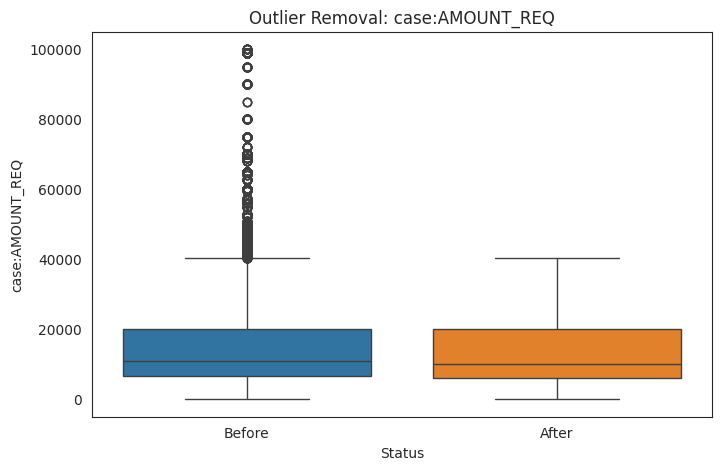

In [18]:
cleaned_event_log = remove_outliers(cleaned_event_log, column="case:AMOUNT_REQ",
                                    plot=True, filepath=os.path.join("figure", "outliers_case_AMOUNT_REQ.png"))

Drop trace with outliers in the duration of the trace. Remove whole cases that are identified as outliers accoring to their duration.

In [19]:
trace_durations = cleaned_event_log.groupby("case:concept:name")["time:timestamp"].agg(lambda x: (x.max() - x.min()).total_seconds())
cleaned_event_log = cleaned_event_log.merge(trace_durations.rename("case:trace_duration"), on="case:concept:name")
print_column_report(cleaned_event_log, 'case:trace_duration', 'Duration of a process request for the trace.')


===== COLUMN REPORT =====
📝 Report for `case:trace_duration` - Duration of a process request for the trace.
-------------------------------------------------------------------------------------
<class 'pandas.core.series.Series'>
Index: 230848 entries, 0 to 262199
Series name: case:trace_duration
Non-Null Count   Dtype  
--------------   -----  
230848 non-null  float64
dtypes: float64(1)
memory usage: 3.5 MB
None
-------------------------------------------------------------------------------------
count    2.308480e+05
mean     1.543332e+06
std      1.227956e+06
min      1.855000e+00
25%      7.058671e+05
50%      1.306662e+06
75%      2.412140e+06
max      1.185234e+07
Name: case:trace_duration, dtype: float64
-------------------------------------------------------------------------------------



===== OUTLIER DETECTION PROCESS =====
📌 Outliers detected in `case:trace_duration`: 4305
📌 Lower bound: -1853542.10, Upper bound: 4971549.12
✅ Remaining rows after outlier removal: 226543 (from 230848)



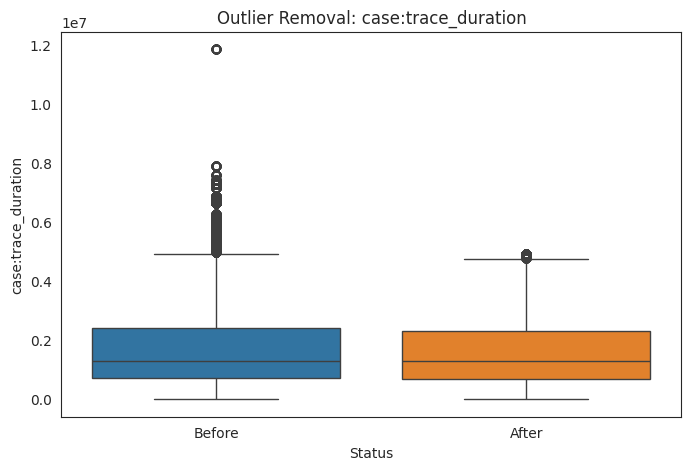

In [20]:
cleaned_event_log = remove_outliers(cleaned_event_log, column="case:trace_duration",
                                    filepath=os.path.join("figure", "outliers_case_trace_duration.png"))

### 3.6 Check *concept:name* vs *lifecycle:transition*

In [21]:
cleaned_event_log.groupby(["concept:name", "lifecycle:transition"]).size().unstack(fill_value=0)

lifecycle:transition,COMPLETE,SCHEDULE,START
concept:name,,,
A_ACCEPTED,4809,0,0
A_ACTIVATED,2149,0,0
A_APPROVED,2149,0,0
A_CANCELLED,2633,0,0
A_DECLINED,7289,0,0
A_FINALIZED,4718,0,0
A_PARTLYSUBMITTED,12442,0,0
A_PREACCEPTED,6903,0,0
A_REGISTERED,2149,0,0


From the above table we can check that there are three different types of events:
* **A_** (State of the application);
* **O_** (State of the offer belonging to the application);
* **W_** (State of the work item belonging to the application).

In addition for each of these events we have different transitions:
* Events of type **A_** and **O_** are just in **COMPLETE** transition;
* Events of type **W_** have three transtitions (**SCHEDULE**, **START**, **COMPLETE**).

Hence, we create three sublog and we work on each of them.



---



## **4 - Application (A_) Event Log**

In [22]:
log_A = cleaned_event_log[cleaned_event_log["concept:name"].str.startswith("A_")]
log_A

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ,case:trace_duration
0,112,COMPLETE,A_SUBMITTED,2011-10-01 00:38:44.546,2011-10-01 00:38:44.546,173688,20000,1072732.480
1,112,COMPLETE,A_PARTLYSUBMITTED,2011-10-01 00:38:44.880,2011-10-01 00:38:44.546,173688,20000,1072732.480
2,112,COMPLETE,A_PREACCEPTED,2011-10-01 00:39:37.906,2011-10-01 00:38:44.546,173688,20000,1072732.480
5,10862,COMPLETE,A_ACCEPTED,2011-10-01 11:42:43.308,2011-10-01 00:38:44.546,173688,20000,1072732.480
7,10862,COMPLETE,A_FINALIZED,2011-10-01 11:45:09.243,2011-10-01 00:38:44.546,173688,20000,1072732.480
...,...,...,...,...,...,...,...,...
262185,10933,COMPLETE,A_ACCEPTED,2012-03-01 20:17:22.457,2012-02-29 23:43:09.766,214373,8500,824865.115
262187,10933,COMPLETE,A_FINALIZED,2012-03-01 20:22:38.593,2012-02-29 23:43:09.766,214373,8500,824865.115
262194,112,COMPLETE,A_SUBMITTED,2012-02-29 23:51:16.799,2012-02-29 23:51:16.799,214376,15000,34584.526
262195,112,COMPLETE,A_PARTLYSUBMITTED,2012-02-29 23:51:17.423,2012-02-29 23:51:16.799,214376,15000,34584.526


In [23]:
print(f"📝 Number of unique events: {len(log_A['concept:name'].unique())}")
print(f"🔥 Max number of events in a single trace: {log_A['case:concept:name'].value_counts().max()}")

📝 Number of unique events: 10
🔥 Max number of events in a single trace: 8


Since the number of events in **A_** is 10 and the maximun number of events across the traces in **A_** is 8, we believe that this log does not contain any recurrent behavior.

### 4.1 - Exploratory Data Analysis

#### 4.1.1 Discover *rare* and *dominant* **concept:name**


===== PLOTTING & SAVING: concept:name DISTRIBUTION =====


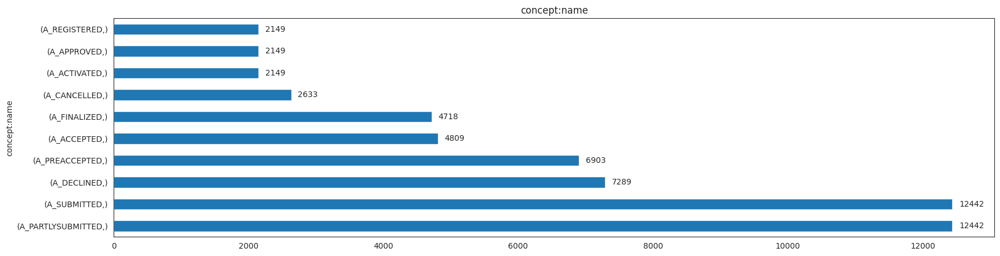

📌 Total items: 57683
⚠️ Low-frequency items (<577 occurrences): 0 items
🔥 High-frequency items (>5768 occurrences): 4 items

🔹 Low-frequency items (examples):
Series([], Name: count, dtype: int64)

🔥 High-frequency items (examples):
concept:name     
A_PARTLYSUBMITTED    12442
A_SUBMITTED          12442
A_DECLINED            7289
A_PREACCEPTED         6903
Name: count, dtype: int64


In [24]:
event_counts = show_values_count_distribution(log=log_A, column="concept:name",
                               figsize=(20, 5), text_offset=100,
                               filepath=os.path.join("figure",
                                                     "log_A_value_counts_concept_name.png"))

# Classify event based on their frequencies
event_classification = classify_counts(count_series=event_counts, total_count=log_A.shape[0])

### 4.2 - Process Discovery

In [25]:
event_log_A = convert_to_event_log(log_A)
overall_metrics = {}

#### 4.2.1 Alpha Miner


===== DISCOVERING PETRI NET USING ALPHA ALGORITHM =====


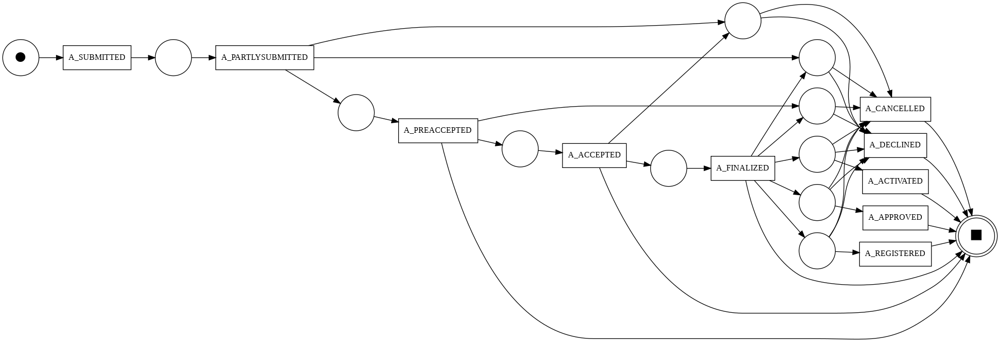


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 12
🔹 Number of transitions: 10
🔹 Number of arcs: 41
🔹 Initial marking: ['start:1']
🔹 Final marking: ['end:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


replaying log with TBR, completed traces ::   0%|          | 0/17 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 0, 'average_trace_fitness': 0.7321028359467153, 'log_fitness': 0.7020620118792366, 'percentage_of_fitting_traces': 0.0}


replaying log with TBR, completed traces ::   0%|          | 0/14 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/17 [00:00<?, ?it/s]

📈 Generalization: 0.9845138963059077
✨ Simplicity: 0.3666666666666667


In [26]:
net_alpha_A, im_alpha_A, fm_alpha_A = discover_petri_net(event_log_A, algorithm="alpha",
                                 filepath=os.path.join("figure", "log_A_petri_net_alpha.png"))
overall_metrics['Alpha Miner'] = evaluate_petri_net_metrics(event_log_A, net_alpha_A, im_alpha_A, fm_alpha_A)

#### 4.2.2 Heuristics Miner


===== DISCOVERING PETRI NET USING HEURISTICS ALGORITHM =====


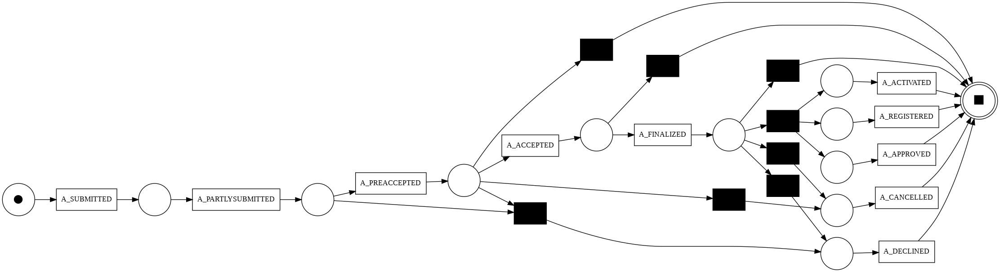


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 12
🔹 Number of transitions: 18
🔹 Number of arcs: 39
🔹 Initial marking: ['source0:1']
🔹 Final marking: ['sink0:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 29.50490274875422, 'average_trace_fitness': 0.7922037909580117, 'log_fitness': 0.8041448650439318, 'percentage_of_fitting_traces': 29.50490274875422}


computing precision with alignments, completed variants ::   0%|          | 0/14 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/17 [00:00<?, ?it/s]

📈 Generalization: 0.8871348951196839
✨ Simplicity: 0.625


In [27]:
net_heuristics_A, im_heuristics_A, fm_heuristics_A = discover_petri_net(event_log_A, algorithm="heuristics",
                                 filepath=os.path.join("figure", "log_A_petri_net_heuristics.png"))
overall_metrics['Heuristics Miner'] = evaluate_petri_net_metrics(event_log_A, net_heuristics_A, im_heuristics_A, fm_heuristics_A)

#### 4.2.3 Inductive Miner


===== DISCOVERING PETRI NET USING INDUCTIVE ALGORITHM =====


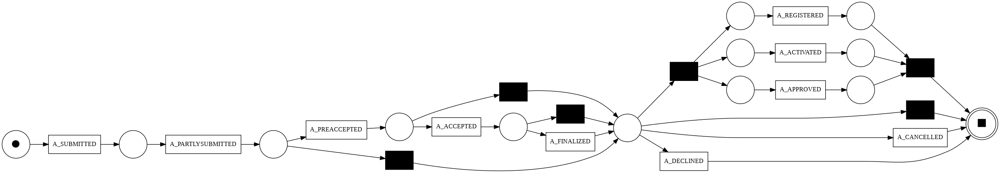


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 13
🔹 Number of transitions: 16
🔹 Number of arcs: 36
🔹 Initial marking: ['source:1']
🔹 Final marking: ['sink:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/17 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9999849908238017, 'percentage_of_fitting_traces': 100.0}


computing precision with alignments, completed variants ::   0%|          | 0/14 [00:00<?, ?it/s]

🎯 Precision: 0.6348768472906403


replaying log with TBR, completed traces ::   0%|          | 0/17 [00:00<?, ?it/s]

📈 Generalization: 0.9756225280883029
✨ Simplicity: 0.6744186046511628


In [28]:
net_inductive_A, im_inductive_A, fm_inductive_A = discover_petri_net(event_log_A, algorithm="inductive",
                                 filepath=os.path.join("figure", "log_A_petri_net_inductive.png"))
overall_metrics['Inductive Miner'] = evaluate_petri_net_metrics(event_log_A, net_inductive_A, im_inductive_A, fm_inductive_A)

#### 4.2.4 Summary and Comparison

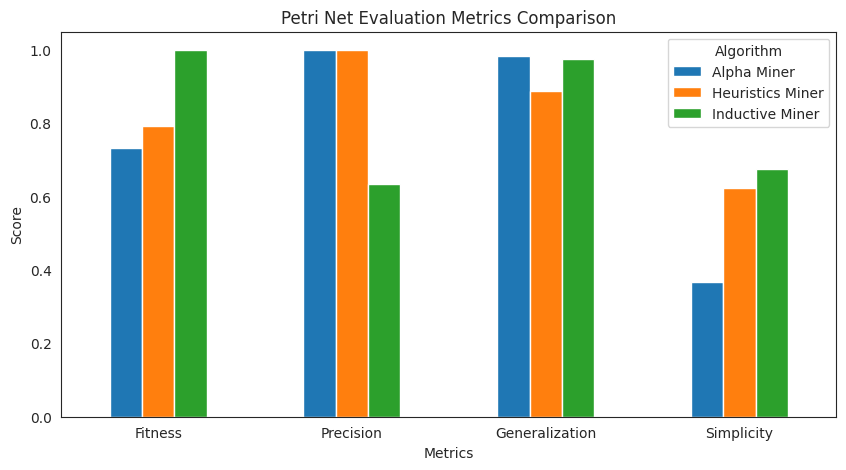

In [29]:
plot_and_save_petri_net_metrics(overall_metrics, save_path=os.path.join("figure", "log_A_overall_metrics.png"))

### 4.3 - LLM Integration for Textual and Visual Abstractions & Report Generation

#### 4.3.1 Abstraction Generation using *pm4py.llm.*

##### Compares abstract_case() output with actual trace data

In [30]:
case_abstraction = validate_case_abstraction(event_log_A, case_index=1)


📊 Case Abstraction Validation:
🔹 Case 1 Raw Data:
    - A_SUBMITTED; 2011-10-01 08:08:58.256000; COMPLETE; 112
    - A_PARTLYSUBMITTED; 2011-10-01 08:09:02.195000; COMPLETE; 112
    - A_PREACCEPTED; 2011-10-01 08:09:56.648000; COMPLETE; 112
    - A_ACCEPTED; 2011-10-01 14:33:54.614000; COMPLETE; 10862
    - A_FINALIZED; 2011-10-01 14:35:46.016000; COMPLETE; 10862
    - A_APPROVED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - A_REGISTERED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - A_ACTIVATED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
-------------------------------------------------------------------------------------

🔍 Generated Case Summary:

If I have a case with the following (case) attributes:

REG_DATE = 2011-10-01 08:08:58.256000
concept:name = 173691
AMOUNT_REQ = 5000
trace_duration = 799716.377


the case contains the following events (the activity of the event is reported first):

A_SUBMITTED ( timestamp = 2011-10-01 08:08:58.256000 ;  lifecycle:transition = 

##### Checks abstract_variants() output against real process variants

In [31]:
variants_abstraction = validate_variants_abstraction(event_log_A)


📊 Process Variants Validation:

===== PROCESS VARIANTS ANALYSIS =====
📝 Total unique variants: 17
                                                                                                        Variant  Occurrences
                                                                   (A_SUBMITTED, A_PARTLYSUBMITTED, A_DECLINED)         5538
                          (A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_ACCEPTED, A_FINALIZED, A_CANCELLED)         1534
                                                   (A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_CANCELLED)         1037
                                                    (A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_DECLINED)          995
                           (A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_ACCEPTED, A_FINALIZED, A_DECLINED)          729
(A_SUBMITTED, A_PARTLYSUBMITTED, A_PREACCEPTED, A_ACCEPTED, A_FINALIZED, A_APPROVED, A_REGISTERED, A_ACTIVATED)          568
(A_SUBMITTED, A_PARTLYSUBM

##### Ensures abstract_log_attributes() matches real log attributes

In [32]:
validate_log_attributes_abstraction(event_log_A)


📊 Log Attributes Validation:
🔹 Number of unique activities: 10
🔹 Most frequent activities:
 concept:name
A_PARTLYSUBMITTED    12442
A_SUBMITTED          12442
A_DECLINED            7289
A_PREACCEPTED         6903
A_ACCEPTED            4809
Name: count, dtype: int64
🔹 Available attributes in the dataset:
 ['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ', 'case:trace_duration']

🔍 Generated Log Attributes Summary:
case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-09 13:26:10.800999936'), 0.5: Timestamp('2011-12-16 12:12:11.675000064'), 0.75: Timestamp('2012-01-25 18:56:55.719000064'), 1.0: Timestamp('2012-02-29 23:51:16.799000064')}
case:trace_duration  empty: 0  quantiles: {0.0: 1.855, 0.25: 3615.957, 0.5: 779192.539, 0.75: 1550576.571, 1.0: 4928049.989}
concept:name  empty: 0 values: (A_SUBMITTED; freq. 12442) (A_PARTLYSUBMITTED; freq. 12442) (

"case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-09 13:26:10.800999936'), 0.5: Timestamp('2011-12-16 12:12:11.675000064'), 0.75: Timestamp('2012-01-25 18:56:55.719000064'), 1.0: Timestamp('2012-02-29 23:51:16.799000064')}\ncase:trace_duration  empty: 0  quantiles: {0.0: 1.855, 0.25: 3615.957, 0.5: 779192.539, 0.75: 1550576.571, 1.0: 4928049.989}\nconcept:name  empty: 0 values: (A_SUBMITTED; freq. 12442) (A_PARTLYSUBMITTED; freq. 12442) (A_DECLINED; freq. 7289) (A_PREACCEPTED; freq. 6903) (A_ACCEPTED; freq. 4809) (A_FINALIZED; freq. 4718) (A_CANCELLED; freq. 2633) (A_REGISTERED; freq. 2149) (A_APPROVED; freq. 2149) (A_ACTIVATED; freq. 2149)\norg:resource  empty: 0 values: (112; freq. 33707) (10138; freq. 2152) (10972; freq. 1530) (10609; freq. 1227) (10629; freq. 1214) (11169; freq. 990) (10809; freq. 880) (11189; freq. 785) (10910; freq. 723) (10982; freq. 657) (10861; freq. 653) (11202; freq. 643) (10913; freq. 618) (11119

##### Compares abstract_petri_net() output with real Petri net structure



###### Alpha Miner Evaluation

In [33]:
petri_net_alpha_abstraction_A = validate_petri_net_abstraction(net_alpha_A, im_alpha_A, fm_alpha_A)


📊 Petri Net Validation:
🔹 Petri Net Places: {"({'A_PARTLYSUBMITTED', 'A_FINALIZED'}, {'A_CANCELLED', 'A_DECLINED'})", "({'A_PARTLYSUBMITTED'}, {'A_PREACCEPTED'})", "({'A_FINALIZED'}, {'A_REGISTERED', 'A_CANCELLED', 'A_DECLINED'})", 'start', "({'A_FINALIZED', 'A_PREACCEPTED'}, {'A_CANCELLED', 'A_DECLINED'})", "({'A_PREACCEPTED'}, {'A_ACCEPTED'})", "({'A_ACCEPTED'}, {'A_FINALIZED'})", 'end', "({'A_FINALIZED'}, {'A_ACTIVATED', 'A_CANCELLED', 'A_DECLINED'})", "({'A_SUBMITTED'}, {'A_PARTLYSUBMITTED'})", "({'A_PARTLYSUBMITTED', 'A_ACCEPTED'}, {'A_CANCELLED', 'A_DECLINED'})", "({'A_FINALIZED'}, {'A_APPROVED', 'A_CANCELLED', 'A_DECLINED'})"}
🔹 Petri Net Transitions: {'A_PARTLYSUBMITTED', 'A_FINALIZED', 'A_ACCEPTED', 'A_CANCELLED', 'A_APPROVED', 'A_PREACCEPTED', 'A_DECLINED', 'A_REGISTERED', 'A_ACTIVATED', 'A_SUBMITTED'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ ({'A_ACCEPTED'}, {'A_FINALIZED'}), ({'A_FINALIZED', 'A_PREACCEPTED'}, {'A_CANCELLED', 'A_DECLINED'}), ({'A_

###### Heuristics Miner Evaluation

In [34]:
petri_net_heuristics_abstraction_A = validate_petri_net_abstraction(net_heuristics_A, im_heuristics_A, fm_heuristics_A)


📊 Petri Net Validation:
🔹 Petri Net Places: {'intplace_A_ACCEPTED', 'pre_A_CANCELLED', 'intplace_A_PREACCEPTED', 'intplace_A_FINALIZED', 'pre_A_ACTIVATED', 'sink0', 'pre_A_REGISTERED', 'pre_A_APPROVED', 'source0', 'pre_A_DECLINED', 'intplace_A_PARTLYSUBMITTED', 'pre_A_PARTLYSUBMITTED'}
🔹 Petri Net Transitions: {'A_PARTLYSUBMITTED', 'A_FINALIZED', 'A_ACCEPTED', 'A_CANCELLED', 'A_APPROVED', 'A_PREACCEPTED', 'A_DECLINED', 'A_REGISTERED', 'A_ACTIVATED', 'A_SUBMITTED'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ intplace_A_ACCEPTED, intplace_A_FINALIZED, intplace_A_PARTLYSUBMITTED, intplace_A_PREACCEPTED, pre_A_ACTIVATED, pre_A_APPROVED, pre_A_CANCELLED, pre_A_DECLINED, pre_A_PARTLYSUBMITTED, pre_A_REGISTERED, sink0, source0 ]
transitions: [ (A_ACCEPTED, 'A_ACCEPTED'), (A_ACTIVATED, 'A_ACTIVATED'), (A_APPROVED, 'A_APPROVED'), (A_CANCELLED, 'A_CANCELLED'), (A_DECLINED, 'A_DECLINED'), (A_FINALIZED, 'A_FINALIZED'), (A_PARTLYSUBMITTED, 'A_PARTLYSUBMITTED'), (A_PREACCEPT

###### Inductive Miner Evaluation

In [35]:
petri_net_inductive_abstraction_A = validate_petri_net_abstraction(net_inductive_A, im_inductive_A, fm_inductive_A)


📊 Petri Net Validation:
🔹 Petri Net Places: {'p_4', 'p_7', 'p_9', 'p_6', 'source', 'p_3', 'p_11', 'p_13', 'p_5', 'p_10', 'p_12', 'sink', 'p_8'}
🔹 Petri Net Transitions: {'A_PARTLYSUBMITTED', 'A_FINALIZED', 'A_ACCEPTED', 'A_CANCELLED', 'A_APPROVED', 'A_PREACCEPTED', 'A_DECLINED', 'A_REGISTERED', 'A_ACTIVATED', 'A_SUBMITTED'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ p_10, p_11, p_12, p_13, p_3, p_4, p_5, p_6, p_7, p_8, p_9, sink, source ]
transitions: [ (446079e4-ec8f-4f15-b1cb-504b3f8e3b43, 'A_REGISTERED'), (481b6a1f-eb4c-42d1-a486-45f6f3a62c73, 'A_FINALIZED'), (59ccaeb0-efe2-45a2-8e96-de5d51332d18, 'A_SUBMITTED'), (75241f86-2846-4768-838a-267eb5d166f9, 'A_PREACCEPTED'), (75ab150a-d134-47f7-874f-6de21f2c24e5, 'A_CANCELLED'), (923c7a0e-0bda-4219-99d2-8dd8b5188892, 'A_PARTLYSUBMITTED'), (c5782822-e72b-4bfb-8b67-3f965be6b049, 'A_ACCEPTED'), (c8114350-febc-4d66-82ab-ae94236a277d, 'A_DECLINED'), (d5d144dc-407a-46a6-bd63-56d90dccb0f0, 'A_ACTIVATED'), (fcdc6544-2be2

#### 4.3.2 Query the LLMs for case and variants abstraction explanation


In [36]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "case", case_abstraction, "What are the anomalies?"))

## Analysis of the Case Abstraction and Anomalies

This case abstraction reveals several potential anomalies and areas for improvement in the underlying process.

**Process Description:**

The process appears to represent an application or request lifecycle, potentially for a loan or similar financial product.  It starts with submission (A_SUBMITTED) and proceeds through various stages of verification and approval before being finalized and activated.

**Anomalies and Inconsistencies:**

1. **Redundant Activities:**  A_APPROVED, A_REGISTERED, and A_ACTIVATED occur at the exact same timestamp and are executed by the same resource. This strongly suggests redundancy. These activities are likely automated and could be combined into a single step or handled asynchronously in the background.  This redundancy adds unnecessary complexity to the process model and might inflate performance metrics.

2. **Long Duration Between A_ACCEPTED and A_APPROVED:** There's a significant time gap (approxima

In [37]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "variants", variants_abstraction, "Can you explain the different paths?"))

## Analysis of Process Variants

The provided process variants describe the lifecycle of an application (likely a loan, insurance, or similar).  Several paths are possible, with varying frequencies and performance (likely representing processing time).

**Explanation of the Process:**

The process begins with `A_SUBMITTED` and progresses to `A_PARTLYSUBMITTED`.  From there, several outcomes are possible:

* **Fast Decline:**  `A_DECLINED` directly after `A_PARTLYSUBMITTED`. This is the most frequent path and also the fastest.
* **Pre-Acceptance and further processing:** `A_PREACCEPTED` leads to various paths:
    * **Cancellation:** `A_CANCELLED` can occur either directly after `A_PREACCEPTED` or after `A_ACCEPTED`.
    * **Decline:** `A_DECLINED` can also occur after `A_PREACCEPTED`, or even after `A_ACCEPTED` and `A_FINALIZED`.
    * **Acceptance and Finalization:** `A_ACCEPTED` followed by `A_FINALIZED` leads to several paths involving `A_APPROVED`, `A_REGISTERED`, and `A_ACTIVATED`

#### 4.3.3 Petri Net Evaluation using LLM & Large Vision Language Models (LVLMs)

##### Alpha Miner Evaluation

In [38]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_alpha_abstraction_A, "Explain the process in the net."))

## Analysis of the Petri Net Model

This Petri net models a process involving the submission and processing of an application (or similar entity).  Let's break down the process, identify anomalies, and suggest improvements.

**Process Explanation:**

The process starts with the submission (A_SUBMITTED) of an application. This leads to the application being PARTLYSUBMITTED. From PARTLYSUBMITTED, three paths are possible:

1. **Pre-acceptance (A_PREACCEPTED):** The application can be pre-accepted, which can then lead to full ACCEPTANCE.  After acceptance, the process can finalize (A_FINALIZED).
2. **Direct Finalization:** The application can be directly FINALIZED from PARTLYSUBMITTED.
3. **Cancellation/Declination:** At both the PARTLYSUBMITTED and PARTLYSUBMITTED with ACCEPTED stages, the application can be CANCELLED or DECLINED.

Once FINALIZED, the application can reach several end states: ACTIVATED, APPROVED, REGISTERED.  However, cancellation and declination are also possible after 

In [39]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_A_petri_net_alpha.png"))

This Petri net models a process with several potential issues. Let's break down the process flow, identify problems, and suggest improvements.

**Process Flow Description:**

The process begins with a submission (`A_SUBMITTED`).  It can either be a complete submission or a partial one (`A_PARTLYSUBMITTED`). A partially submitted item transitions to a `PREACCEPTED` state.  Both complete and partially submitted items can potentially reach an `ACCEPTED` state,  following which the item is `FINALIZED`.  After finalization, the item can be `APPROVED`, `ACTIVATED`, `DECLINED`, or `CANCELLED`.  All these final states lead to the `REGISTERED` state, indicating the end of the process.  Note that there are several intermediate places (circles) that seem redundant and unclear in their purpose.

**Deadlocks/Livelocks:**

There are no apparent classical deadlocks (a state where no transitions can fire). However, the Petri net's structure implies a potential for livelock. The multiple intermediate p

##### Heuristics Miner Evaluation

In [40]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_heuristics_abstraction_A, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net models a process involving the lifecycle of an entity "A" (e.g., an application, order, or request).  It reveals several potential issues and areas for improvement.

**Anomalies and Inconsistencies:**

* **Hidden Transitions (hid_*):**  The presence of numerous hidden transitions (e.g., hid_2, hid_8, hid_10, etc.) obscures the actual process logic.  These transitions don't represent real-world activities and make the model difficult to understand. They likely represent implicit choices or routing logic that should be explicitly modeled.
* **Unclear Splitting/Joining:** The model uses hidden transitions to create splits and joins, making it hard to determine the conditions governing these decisions. For example, after `intplace_A_FINALIZED`, multiple hidden transitions lead to different outcomes (activated, approved, cancelled, declined).  The criteria for choosing these paths are not represented.
* **Potential Deadlocks:** The multiple paths

In [41]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_A_petri_net_heuristics.png"))

This Petri net represents a process with several stages, from submission to finalization or rejection. However, it suffers from several design flaws hindering efficiency and correctness. Let's analyze it step-by-step:

**Process Flow Description:**

The process begins with a submission (A_SUBMITTED).  It can be either fully submitted or partially submitted (A_PARTLYSUBMITTED).  A partially submitted application proceeds to a pre-acceptance stage (A_PREACCEPTED).  Fully submitted and pre-accepted applications both proceed to an acceptance stage (A_ACCEPTED). Accepted applications then move to a finalization stage (A_FINALIZED).  

At various points, the application can transition into different states:  it can be activated (A_ACTIVATED), registered (A_REGISTERED), approved (A_APPROVED), cancelled (A_CANCELLED), or declined (A_DECLINED). The final state is represented by the central black square.  The black squares scattered throughout the net likely represent tasks or activities that ne

##### Inductive Miner Evaluation

In [42]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_inductive_abstraction_A, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net describes a process related to application handling (likely loan or insurance applications). It exhibits several anomalies and inefficiencies which will be detailed below.

### Anomalies and Inconsistencies:

1. **Multiple Paths to Finalized:** The `A_FINALIZED` activity can be reached via `A_ACCEPTED` but also directly via three skip transitions (`skip_1`, `skip_2`, `skip_3`). This suggests potential data integrity issues, where applications can be finalized without proper acceptance procedures.

2. **Direct Cancellation/Declined after "Finalized":** After an application is `A_FINALIZED`, it can be `A_CANCELLED` or `A_DECLINED`.  This seems illogical; typically, cancellation or decline would happen *before* finalization. This further reinforces the possibility of flawed process logic.

3. **Unclear Purpose of `A_ACTIVATED` and Parallel Split:** The `tauSplit_5` creates a parallel split after `A_FINALIZED`, leading to `A_ACTIVATED`, `A_APPRO

In [43]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_A_petri_net_inductive.png"))

This Petri net depicts a process with several stages, primarily focused on application processing. Let's break down the process flow, identify issues, and suggest improvements.

**Process Flow Description:**

The process begins with an application being submitted (A_SUBMITTED).  It then transitions to either being partially submitted (A_PARTLYSUBMITTED) or directly to being pre-accepted (A_PREACCEPTED). From A_PARTLYSUBMITTED, the application can proceed to A_PREACCEPTED.  Following pre-acceptance, the application proceeds to A_ACCEPTED.  After acceptance, the application moves to a stage represented by a black square (let's call it "Stage X").

From Stage X, the application can proceed down three paths:

1. **Approval Path:** The application is approved (A_APPROVED), then registered (A_REGISTERED), and finally activated (A_ACTIVATED).  This leads to a final "Finalized" state (A_FINALIZED).

2. **Declined Path:** The application is declined (A_DECLINED), leading to the "Finalized" stat

#### 4.3.4 Performance Comparison and Evaluations using Large Language Models (LLMs)

In [44]:
print(summarize_metrics(api_key, "gemini-1.5-pro", overall_metrics))

## Comparative Report: Process Mining Algorithms

This report analyzes the performance of three process mining algorithms – Alpha Miner, Heuristics Miner, and Inductive Miner – based on the provided metrics: Fitness, Precision, Generalization, and Simplicity.

**Algorithm Analysis:**

**1. Alpha Miner:**

* **Strengths:**  Achieves perfect precision (1.0), indicating that every activity captured in the discovered model is present in the event log. It also boasts high generalization (0.98), suggesting the model can accurately predict future behavior based on the log.  This makes it suitable for understanding the "happy path" of a process.
* **Weaknesses:**  Relatively low fitness (0.73) reveals the model doesn't fully represent all behavior in the log.  Its low simplicity (0.37) suggests the discovered model might be complex and difficult to interpret. This is a known limitation of Alpha Miner, which tends to create complex models, especially with noisy logs.
* **Pros:** Excellent for d



---



## **5 - Offer (O_) Event Log**

In [45]:
log_O = cleaned_event_log[cleaned_event_log["concept:name"].str.startswith("O_")]
log_O

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ,case:trace_duration
6,10862,COMPLETE,O_SELECTED,2011-10-01 11:45:09.243,2011-10-01 00:38:44.546,173688,20000,1072732.480
8,10862,COMPLETE,O_CREATED,2011-10-01 11:45:11.197,2011-10-01 00:38:44.546,173688,20000,1072732.480
9,10862,COMPLETE,O_SENT,2011-10-01 11:45:11.380,2011-10-01 00:38:44.546,173688,20000,1072732.480
17,11049,COMPLETE,O_SENT_BACK,2011-10-10 11:33:03.668,2011-10-01 00:38:44.546,173688,20000,1072732.480
23,10629,COMPLETE,O_ACCEPTED,2011-10-13 10:37:29.226,2011-10-01 00:38:44.546,173688,20000,1072732.480
...,...,...,...,...,...,...,...,...
262157,11003,COMPLETE,O_SENT,2012-03-02 10:14:43.303,2012-02-29 23:22:24.570,214364,5000,733163.786
262165,10789,COMPLETE,O_SENT_BACK,2012-03-09 11:01:46.008,2012-02-29 23:22:24.570,214364,5000,733163.786
262186,10933,COMPLETE,O_SELECTED,2012-03-01 20:22:38.593,2012-02-29 23:43:09.766,214373,8500,824865.115
262188,10933,COMPLETE,O_CREATED,2012-03-01 20:22:40.016,2012-02-29 23:43:09.766,214373,8500,824865.115


In [46]:
print(f"📝 Number of unique events: {len(log_O['concept:name'].unique())}")
print(f"🔥 Max number of events in a single trace: {log_O['case:concept:name'].value_counts().max()}")

📝 Number of unique events: 7
🔥 Max number of events in a single trace: 30


Since the number of events in **O_** is 7 and the maximun number of events across the traces in **O_** is 30, we believe that this log contains recurrent behavior.

### 5.1 - Exploratory Data Analysis

#### 5.1.1 Discover *rare* and *dominant* **concept:name**


===== PLOTTING & SAVING: concept:name DISTRIBUTION =====


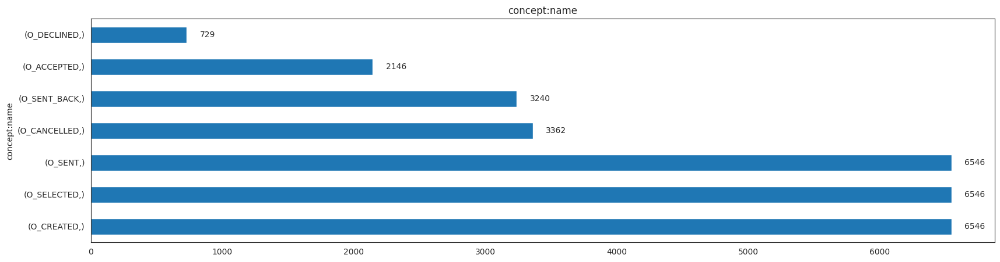

📌 Total items: 29115
⚠️ Low-frequency items (<291 occurrences): 0 items
🔥 High-frequency items (>2912 occurrences): 5 items

🔹 Low-frequency items (examples):
Series([], Name: count, dtype: int64)

🔥 High-frequency items (examples):
concept:name
O_CREATED       6546
O_SELECTED      6546
O_SENT          6546
O_CANCELLED     3362
O_SENT_BACK     3240
Name: count, dtype: int64


In [47]:
event_counts = show_values_count_distribution(log=log_O, column="concept:name",
                               figsize=(20, 5), text_offset=100,
                               filepath=os.path.join("figure", "log_O_value_counts_concept_name.png"))

# Classify event based on their frequencies
event_classification = classify_counts(count_series=event_counts, total_count=log_O.shape[0])

### 5.2 - Process Discovery

In [48]:
event_log_O = convert_to_event_log(log_O)
overall_metrics = {}

#### 5.2.1 Alpha Miner


===== DISCOVERING PETRI NET USING ALPHA ALGORITHM =====


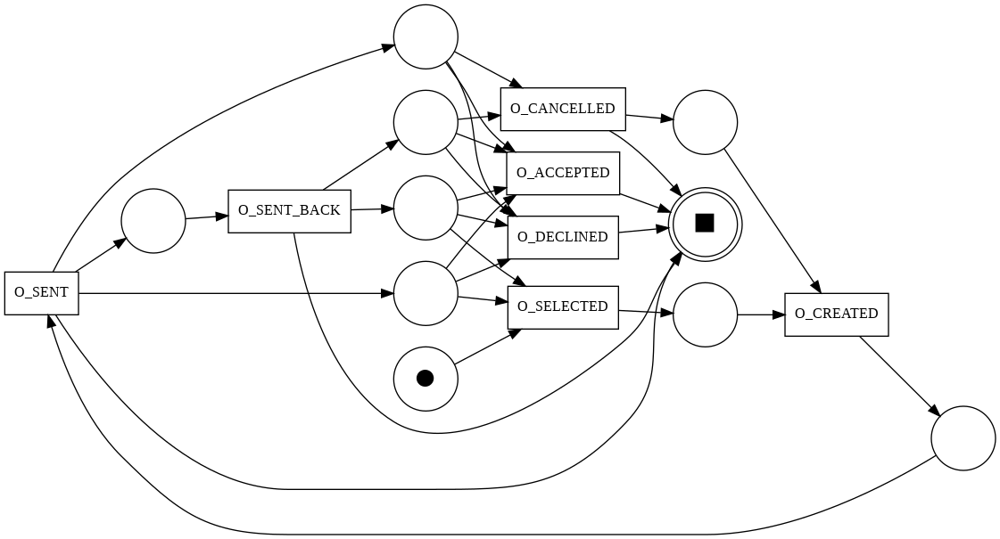


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 10
🔹 Number of transitions: 7
🔹 Number of arcs: 30
🔹 Initial marking: ['start:1']
🔹 Final marking: ['end:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


replaying log with TBR, completed traces ::   0%|          | 0/158 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 0, 'average_trace_fitness': 0.6891848689589762, 'log_fitness': 0.6948057063193096, 'percentage_of_fitting_traces': 0.0}


replaying log with TBR, completed traces ::   0%|          | 0/389 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/158 [00:00<?, ?it/s]

📈 Generalization: 0.9813545935431564
✨ Simplicity: 0.39534883720930236


In [49]:
net_alpha_O, im_alpha_O, fm_alpha_O = discover_petri_net(event_log_O, algorithm="alpha",
                                 filepath=os.path.join("figure", "log_O_petri_net_alpha.png"))
overall_metrics['Alpha Miner'] = evaluate_petri_net_metrics(event_log_O, net_alpha_O, im_alpha_O, fm_alpha_O)

#### 5.2.2 Heuristics Miner


===== DISCOVERING PETRI NET USING HEURISTICS ALGORITHM =====


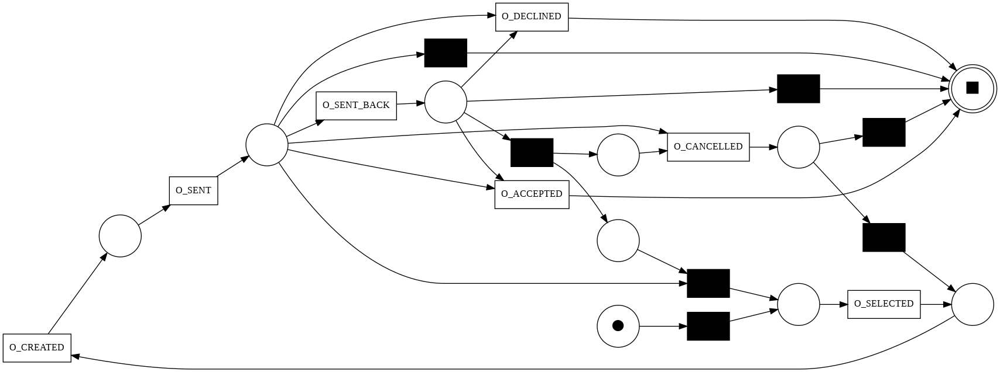


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 10
🔹 Number of transitions: 14
🔹 Number of arcs: 33
🔹 Initial marking: ['source0:1']
🔹 Final marking: ['sink0:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/158 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 4.196693514200932, 'average_trace_fitness': 0.7779095759595624, 'log_fitness': 0.7250067226803596, 'percentage_of_fitting_traces': 4.196693514200932}


computing precision with alignments, completed variants ::   0%|          | 0/389 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/158 [00:00<?, ?it/s]

📈 Generalization: 0.8737984215396573
✨ Simplicity: 0.5714285714285714


In [50]:
net_heuristics_O, im_heuristics_O, fm_heuristics_O = discover_petri_net(event_log_O, algorithm="heuristics",
                                 filepath=os.path.join("figure", "log_O_petri_net_heuristics.png"))
overall_metrics['Heuristics Miner'] = evaluate_petri_net_metrics(event_log_O, net_heuristics_O, im_heuristics_O, fm_heuristics_O)

#### 5.2.3 Inductive Miner


===== DISCOVERING PETRI NET USING INDUCTIVE ALGORITHM =====


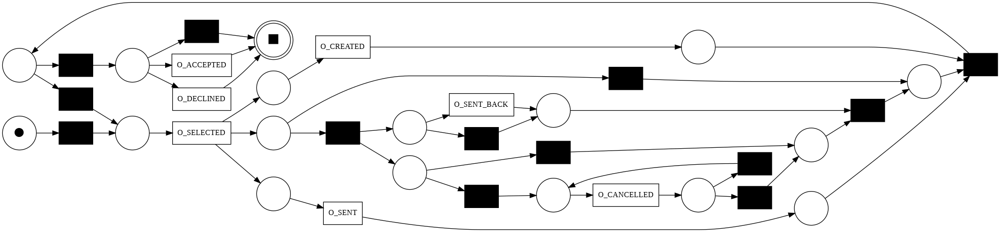


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 17
🔹 Number of transitions: 20
🔹 Number of arcs: 46
🔹 Initial marking: ['source:1']
🔹 Final marking: ['sink:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/158 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9999000146956327, 'percentage_of_fitting_traces': 100.0}


computing precision with alignments, completed variants ::   0%|          | 0/389 [00:00<?, ?it/s]

🎯 Precision: 0.5529495242075797


replaying log with TBR, completed traces ::   0%|          | 0/158 [00:00<?, ?it/s]

📈 Generalization: 0.979403271673825
✨ Simplicity: 0.6727272727272727


In [51]:
net_inductive_O, im_inductive_O, fm_inductive_O = discover_petri_net(event_log_O, algorithm="inductive",
                                 filepath=os.path.join("figure", "log_O_petri_net_inductive.png"))
overall_metrics['Inductive Miner'] = evaluate_petri_net_metrics(event_log_O, net_inductive_O, im_inductive_O, fm_inductive_O)

#### 5.2.4 Summary and Comparison

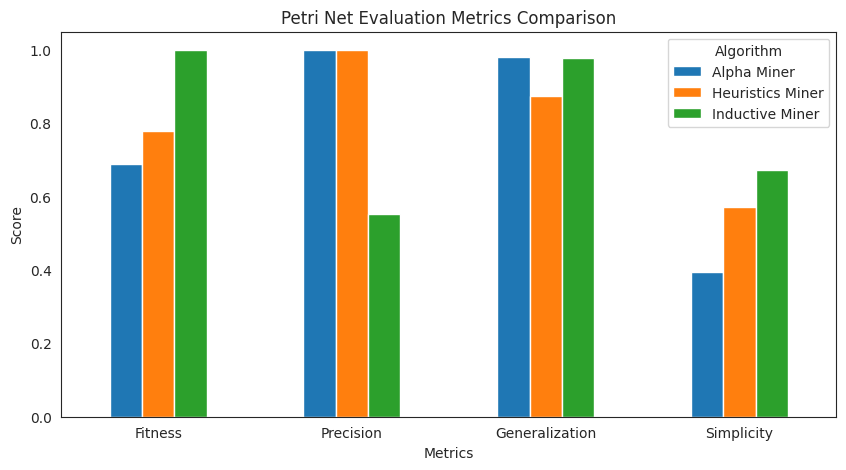

In [52]:
plot_and_save_petri_net_metrics(overall_metrics, save_path=os.path.join("figure", "log_O_overall_metrics.png"))

### 5.3 - LLM Integration for Textual and Visual Abstractions & Report Generation

#### 5.3.1 Abstraction Generation using *pm4py.llm.*

##### Compares abstract_case() output with actual trace data

In [53]:
case_abstraction = validate_case_abstraction(event_log_O, case_index=1)


📊 Case Abstraction Validation:
🔹 Case 1 Raw Data:
    - O_SELECTED; 2011-10-01 14:35:46.016000; COMPLETE; 10862
    - O_CREATED; 2011-10-01 14:35:47.488000; COMPLETE; 10862
    - O_SENT; 2011-10-01 14:35:47.583000; COMPLETE; 10862
    - O_SELECTED; 2011-10-03 16:56:17.731000; COMPLETE; 11120
    - O_CANCELLED; 2011-10-03 16:56:17.731000; COMPLETE; 11120
    - O_CREATED; 2011-10-03 16:56:19.613000; COMPLETE; 11120
    - O_SENT; 2011-10-03 16:56:19.645000; COMPLETE; 11120
    - O_SENT_BACK; 2011-10-10 10:14:43.775000; COMPLETE; 11049
    - O_ACCEPTED; 2011-10-10 14:17:26.306000; COMPLETE; 10809
-------------------------------------------------------------------------------------

🔍 Generated Case Summary:

If I have a case with the following (case) attributes:

REG_DATE = 2011-10-01 08:08:58.256000
concept:name = 173691
AMOUNT_REQ = 5000
trace_duration = 799716.377


the case contains the following events (the activity of the event is reported first):

O_SELECTED ( timestamp = 2011-10-0

##### Checks abstract_variants() output against real process variants

In [54]:
variants_abstraction = validate_variants_abstraction(event_log_O)


📊 Process Variants Validation:

===== PROCESS VARIANTS ANALYSIS =====
📝 Total unique variants: 158
                                                                                                                                                                                                                                                                                                                                      Variant  Occurrences
                                                                                                                                                                                                                                                                                     (O_SELECTED, O_CREATED, O_SENT, O_SENT_BACK, O_ACCEPTED)         1484
                                                                                                                                                                                                              

##### Ensures abstract_log_attributes() matches real log attributes

In [55]:
validate_log_attributes_abstraction(event_log_O)


📊 Log Attributes Validation:
🔹 Number of unique activities: 7
🔹 Most frequent activities:
 concept:name
O_CREATED      6546
O_SELECTED     6546
O_SENT         6546
O_CANCELLED    3362
O_SENT_BACK    3240
Name: count, dtype: int64
🔹 Available attributes in the dataset:
 ['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ', 'case:trace_duration']

🔍 Generated Log Attributes Summary:
case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-08 18:35:47.257999872'), 0.5: Timestamp('2011-12-21 10:51:26.761999872'), 0.75: Timestamp('2012-01-25 20:24:22.704000'), 1.0: Timestamp('2012-02-29 23:43:09.766000128')}
case:trace_duration  empty: 0  quantiles: {0.0: 507.914, 0.25: 947928.962, 0.5: 1386471.477, 0.75: 2202116.865, 1.0: 4928049.989}
concept:name  empty: 0 values: (O_SENT; freq. 6546) (O_SELECTED; freq. 6546) (O_CREATED; freq. 6546) (O_CANCELLED; freq. 3362)

"case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-08 18:35:47.257999872'), 0.5: Timestamp('2011-12-21 10:51:26.761999872'), 0.75: Timestamp('2012-01-25 20:24:22.704000'), 1.0: Timestamp('2012-02-29 23:43:09.766000128')}\ncase:trace_duration  empty: 0  quantiles: {0.0: 507.914, 0.25: 947928.962, 0.5: 1386471.477, 0.75: 2202116.865, 1.0: 4928049.989}\nconcept:name  empty: 0 values: (O_SENT; freq. 6546) (O_SELECTED; freq. 6546) (O_CREATED; freq. 6546) (O_CANCELLED; freq. 3362) (O_SENT_BACK; freq. 3240) (O_ACCEPTED; freq. 2146) (O_DECLINED; freq. 729)\norg:resource  empty: 0 values: (10138; freq. 1072) (11169; freq. 1040) (11189; freq. 993) (11202; freq. 988) (11122; freq. 911) (11200; freq. 893) (11119; freq. 877) (10861; freq. 868) (11259; freq. 861) (11049; freq. 850) (10899; freq. 791) (10972; freq. 787) (10909; freq. 782) (11201; freq. 768) (10609; freq. 768) (11181; freq. 766) (11180; freq. 764) (10982; freq. 762) (10913; 

##### Compares abstract_petri_net() output with real Petri net structure



###### Alpha Miner Evaluation

In [56]:
petri_net_alpha_abstraction_O = validate_petri_net_abstraction(net_alpha_O, im_alpha_O, fm_alpha_O)


📊 Petri Net Validation:
🔹 Petri Net Places: {"({'O_SENT'}, {'O_ACCEPTED', 'O_CANCELLED', 'O_DECLINED'})", 'start', "({'O_CREATED'}, {'O_SENT'})", 'end', "({'O_SENT_BACK'}, {'O_ACCEPTED', 'O_CANCELLED', 'O_DECLINED'})", "({'O_SENT'}, {'O_ACCEPTED', 'O_SELECTED', 'O_DECLINED'})", "({'O_SELECTED'}, {'O_CREATED'})", "({'O_CANCELLED'}, {'O_CREATED'})", "({'O_SENT_BACK'}, {'O_ACCEPTED', 'O_SELECTED', 'O_DECLINED'})", "({'O_SENT'}, {'O_SENT_BACK'})"}
🔹 Petri Net Transitions: {'O_ACCEPTED', 'O_SENT_BACK', 'O_SENT', 'O_CANCELLED', 'O_CREATED', 'O_SELECTED', 'O_DECLINED'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ ({'O_CANCELLED'}, {'O_CREATED'}), ({'O_CREATED'}, {'O_SENT'}), ({'O_SELECTED'}, {'O_CREATED'}), ({'O_SENT'}, {'O_ACCEPTED', 'O_CANCELLED', 'O_DECLINED'}), ({'O_SENT'}, {'O_ACCEPTED', 'O_SELECTED', 'O_DECLINED'}), ({'O_SENT'}, {'O_SENT_BACK'}), ({'O_SENT_BACK'}, {'O_ACCEPTED', 'O_CANCELLED', 'O_DECLINED'}), ({'O_SENT_BACK'}, {'O_ACCEPTED', 'O_SELECTED', 'O_DECL

###### Heuristics Miner Evaluation

In [57]:
petri_net_heuristics_abstraction_O = validate_petri_net_abstraction(net_heuristics_O, im_heuristics_O, fm_heuristics_O)


📊 Petri Net Validation:
🔹 Petri Net Places: {'splace_in_O_SELECTED_O_SENT_BACK_0', 'sink0', 'splace_in_O_CANCELLED_O_SENT_BACK_0', 'pre_O_CREATED', 'source0', 'intplace_O_CANCELLED', 'pre_O_SENT', 'pre_O_SELECTED', 'intplace_O_SENT_BACK', 'intplace_O_SENT'}
🔹 Petri Net Transitions: {'O_ACCEPTED', 'O_SENT_BACK', 'O_SENT', 'O_CANCELLED', 'O_CREATED', 'O_SELECTED', 'O_DECLINED'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ intplace_O_CANCELLED, intplace_O_SENT, intplace_O_SENT_BACK, pre_O_CREATED, pre_O_SELECTED, pre_O_SENT, sink0, source0, splace_in_O_CANCELLED_O_SENT_BACK_0, splace_in_O_SELECTED_O_SENT_BACK_0 ]
transitions: [ (O_ACCEPTED, 'O_ACCEPTED'), (O_CANCELLED, 'O_CANCELLED'), (O_CREATED, 'O_CREATED'), (O_DECLINED, 'O_DECLINED'), (O_SELECTED, 'O_SELECTED'), (O_SENT, 'O_SENT'), (O_SENT_BACK, 'O_SENT_BACK'), (hid_1, None), (hid_13, None), (hid_15, None), (hid_18, None), (hid_19, None), (hid_2, None), (hid_20, None) ]
arcs: [ (O_ACCEPTED, 'O_ACCEPTED')->sink0,

###### Inductive Miner Evaluation

In [58]:
petri_net_inductive_abstraction_O = validate_petri_net_abstraction(net_inductive_O, im_inductive_O, fm_inductive_O)


📊 Petri Net Validation:
🔹 Petri Net Places: {'p_17', 'p_4', 'p_9', 'p_6', 'p_18', 'p_14', 'source', 'p_15', 'p_16', 'p_11', 'p_13', 'p_5', 'p_10', 'p_12', 'p_19', 'sink', 'p_8'}
🔹 Petri Net Transitions: {'O_ACCEPTED', 'O_SENT_BACK', 'O_CANCELLED', 'O_SENT', 'O_CREATED', 'O_SELECTED', 'O_DECLINED'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ p_10, p_11, p_12, p_13, p_14, p_15, p_16, p_17, p_18, p_19, p_4, p_5, p_6, p_8, p_9, sink, source ]
transitions: [ (430b546a-f14b-4a33-813b-11bacb017e38, 'O_CREATED'), (44edacf4-21aa-4ef2-9362-1726d4a6fb60, 'O_SENT'), (66fa1039-e2c2-4a4d-a081-56966b2bbc8e, 'O_DECLINED'), (9aa4c215-3f46-4de7-8f43-b2260985678d, 'O_SELECTED'), (9df98101-fa4a-47b4-aa1f-2f8bf064824c, 'O_SENT_BACK'), (a68df0c6-5e02-45df-9f50-78c990a1a51b, 'O_CANCELLED'), (e3789af6-557b-46b7-9fc8-937b2ea928ba, 'O_ACCEPTED'), (init_loop_11, None), (skip_10, None), (skip_13, None), (skip_14, None), (skip_15, None), (skip_16, None), (skip_17, None), (skip_6, None), (s

#### 5.3.2 Query the LLMs for case and variants abstraction explanation


In [59]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "case", case_abstraction, "What are the anomalies?"))

## Analysis of the Case Abstraction and Anomalies

This case reveals a potential rework loop and some timing inconsistencies that warrant further investigation.

**Process Description:**

The process appears to involve the creation and processing of an "O" object (e.g., an order, offer, or other entity).  The typical flow seems to be:

1. **O_SELECTED:** An "O" is selected.
2. **O_CREATED:** The "O" is created.
3. **O_SENT:** The "O" is sent.
4. **O_ACCEPTED:** The "O" is accepted.

However, this case deviates from this simple flow.


**Anomalies and Inconsistencies:**

1. **Rework Loop:** The sequence `O_SELECTED -> O_CANCELLED -> O_CREATED -> O_SENT` suggests a rework loop.  The initial selection and creation were seemingly reversed or cancelled, requiring the "O" to be created and sent again.  This adds extra time and effort to the process.  It's crucial to understand *why* the cancellation occurred.  Was it due to an error, a change in requirements, or some external factor?

2. **T

In [60]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "variants", variants_abstraction, "Can you explain the different paths?"))

## Analysis of Process Variants

The provided process variants describe an order handling process with cancellation and revision options.  Let's break down the paths, anomalies, and potential improvements.

**Process Explanation:**

The core process flow is: `O_SELECTED -> O_CREATED -> O_SENT`.  After the order is sent, several outcomes are possible:

* **Acceptance:** `O_SENT -> O_SENT_BACK -> O_ACCEPTED`: This is the desired successful path.  `O_SENT_BACK` likely represents a confirmation or feedback step from the recipient before final acceptance.
* **Declination:** `O_SENT -> O_SENT_BACK -> O_DECLINED`: The order is declined after review.
* **Cancellation:** `O_SENT -> O_CANCELLED`: The order is cancelled directly after being sent.
* **Revision/Resubmission:**  The most complex aspect.  After cancellation (`O_CANCELLED`), the process can restart from `O_SELECTED`, allowing for revisions and resubmission. This restarting can happen multiple times, leading to long variants.

**Anomal

#### 5.3.3 Petri Net Evaluation using LLM & Large Vision Language Models (LVLMs)

##### Alpha Miner Evaluation

In [61]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_alpha_abstraction_O, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net models a process involving the lifecycle of an order (or similar entity). Let's break down the process, identify anomalies, and suggest improvements.

**Process Explanation:**

1. **Start:** The process begins with the initial marking in the `start` place.

2. **O_SELECTED:** The first action is `O_SELECTED` (Order Selected), transitioning the token to the place representing a created order.

3. **O_CREATED:**  The order is then `O_CREATED`.

4. **O_SENT:** The order is `O_SENT`.  This is a key branching point in the process.  From here, several outcomes are possible:
    * **O_ACCEPTED:** The order is accepted and the process ends.
    * **O_DECLINED:** The order is declined and the process ends.
    * **O_CANCELLED:** The order is cancelled and the process ends. However, it also loops back to `O_CREATED`, suggesting a possible cancellation and re-creation cycle.
    * **O_SENT_BACK:** The order is sent back for further processing.

5. **O_

In [62]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_O_petri_net_alpha.png"))

This Petri net depicts a process, likely an order processing system.  Let's analyze it step-by-step:

**Process Flow Description:**

The process starts with an order being 'O_SENT'. This order can then follow several paths:

1. **Normal Flow:** The order is processed, resulting in 'O_SELECTED'.  After selection, it transitions to 'O_ACCEPTED', then finally 'O_CREATED'.  'O_CREATED' represents the order's completion.

2. **Rejection Path:** The order might be 'O_DECLINED' at any point before creation, potentially due to insufficient stock, invalid information, etc.  The net doesn't explicitly show what happens after declination, implying the order is simply dropped.  This path needs clarification.

3. **Cancellation Path:**  The order can be 'O_CANCELLED' at various stages, again implying order termination. Similar to declination, the net lacks a clear post-cancellation state.

4. **Sent Back Path:** The order can be 'O_SENT_BACK', indicating a need for correction or additional informat

##### Heuristics Miner Evaluation

In [63]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_heuristics_abstraction_O, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net models a process involving the lifecycle of an "Order" (represented by 'O' prefix). Let's break down the process, identify anomalies, and suggest improvements.

**Process Explanation:**

1. **Start:** The process begins at `source0`.

2. **Order Selection & Creation:** The token moves through hidden transitions (`hid_2`) to `pre_O_SELECTED`, enabling `O_SELECTED`. After selection, the order proceeds to `pre_O_CREATED` (potentially through another hidden transition `hid_1`) and then to `O_CREATED`, indicating order creation.  There's a parallel path from `intplace_O_CANCELLED` through `hid_19` also leading to `pre_O_CREATED`, implying a possible recreation of a canceled order.

3. **Order Sent:**  From `pre_O_SENT`, the order transitions to `O_SENT` and enters `intplace_O_SENT`. This place represents the state where the order has been sent.

4. **Order Outcomes:** `intplace_O_SENT` is a crucial decision point with multiple outcomes:
    - **O

In [64]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_O_petri_net_heuristics.png"))

The Petri net depicts a process, likely order management, with several potential issues. Let's break down the analysis:

**Process Flow Description:**

The process starts with an order being created (`O_CREATED`).  This moves the process to the `O_SENT` state. From here, the order can follow several paths:

1. **Acceptance:** The order is accepted (`O_ACCEPTED`), followed by further processing (represented by the black boxes, indicating tasks or activities), leading to the order being completed (the final state, represented by the double-circled square).

2. **Rejection:** The order is declined (`O_DECLINED`) at some point, again after potential processing (black boxes), and finally reaches the completed state.

3. **Cancellation:** The order is cancelled (`O_CANCELLED`) at some point after being sent, requiring specific steps (black boxes), also eventually reaching the completed state.

4. **Return/Resubmission:** The order is sent back (`O_SENT_BACK`), implying a need for corrections

##### Inductive Miner Evaluation

In [65]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_inductive_abstraction_O, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net models a process related to handling an order (denoted by 'O'). Let's break down the process flow, identify anomalies, and suggest improvements.

**Process Explanation:**

1. **Start:** The process begins with a token in the `source` place.

2. **Initial Choice:** The `tau_1` transition represents an immediate, silent transition leading to `p_5`.  This suggests some implicit initialization before the main order processing.

3. **Order Selection:** `p_5` leads to `O_SELECTED`. This transition creates tokens in three places: `p_10` (leading to order creation), `p_8` (leading to order sending), and `p_12` which branches the process.

4. **Order Creation:** `p_10` leads to `O_CREATED`, placing a token in `p_11`.

5. **Order Sending:** `p_8` leads to `O_SENT`, placing a token in `p_9`.

6. **Synchronization Point 1:** `tauJoin_5` synchronizes the paths from `O_CREATED` (via `p_11`) and `O_SENT` (via `p_9`) along with the initial path from `skip_1

In [66]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_O_petri_net_inductive.png"))

This Petri net models a process, likely an order processing system. Let's analyze it step-by-step:

**Process Flow:**

The process begins with an order being created (`O_CREATED`). The order then moves to an acceptance stage (`O_ACCEPTED`).  From here, the order can either be:

* **Accepted:** Proceeding to a selection phase (`O_SELECTED`), then sent (`O_SENT`), and finally completed (represented by the final black square).
* **Declined:**  The order is declined (`O_DECLINED`), potentially leading to its cancellation (`O_CANCELLED`) and ultimately the end of the process.
* **Sent Back:** The order may be sent back (`O_SENT_BACK`) for some reason, looping back to a prior stage. This implies an iterative process of order review and correction.  The order then could be either accepted or declined again, restarting the process loop until either final acceptance or cancellation.

The black squares represent the end of a specific sub-process or states indicating the completion of a particula

#### 5.3.4 Performance Comparison and Evaluations using Large Language Models (LLMs)

In [67]:
print(summarize_metrics(api_key, "gemini-1.5-pro", overall_metrics))

## Comparative Report: Process Mining Algorithm Performance

This report analyzes the performance of three process mining algorithms – Alpha Miner, Heuristics Miner, and Inductive Miner – based on the provided metrics: Fitness, Precision, Generalization, and Simplicity.

**Algorithm Overview & Metric Interpretation:**

* **Fitness:** Measures how well the discovered model represents the observed behavior in the event log.  A value of 1 indicates a perfect fit.
* **Precision:** Represents the proportion of behavior in the discovered model that is also present in the event log. A value of 1 indicates that all behavior in the model is observed in the log.
* **Generalization:** Measures the model's ability to predict unseen behavior.  A value of 1 suggests excellent generalization.
* **Simplicity:**  Indicates the understandability and maintainability of the discovered model. Higher values represent simpler models.

**Algorithm Analysis:**

**1. Alpha Miner:**

* **Strengths:**  High Preci



---



## **6 - Work (W_) Event Log**

In [68]:
log_W = cleaned_event_log[cleaned_event_log["concept:name"].str.startswith("W_")]
log_W

,org:resource,lifecycle:transition,concept:name,time:timestamp,case:REG_DATE,case:concept:name,case:AMOUNT_REQ,case:trace_duration
3,112,SCHEDULE,W_Completeren aanvraag,2011-10-01 00:39:38.875,2011-10-01 00:38:44.546,173688,20000,1072732.480
14,10913,START,W_Nabellen offertes,2011-10-08 16:26:57.720,2011-10-01 00:38:44.546,173688,20000,1072732.480
15,10913,COMPLETE,W_Nabellen offertes,2011-10-08 16:32:00.886,2011-10-01 00:38:44.546,173688,20000,1072732.480
16,11049,START,W_Nabellen offertes,2011-10-10 11:32:22.495,2011-10-01 00:38:44.546,173688,20000,1072732.480
18,11049,SCHEDULE,W_Valideren aanvraag,2011-10-10 11:33:04.560,2011-10-01 00:38:44.546,173688,20000,1072732.480
...,...,...,...,...,...,...,...,...
262192,11119,START,W_Nabellen offertes,2012-03-10 12:46:22.700,2012-02-29 23:43:09.766,214373,8500,824865.115
262193,11119,COMPLETE,W_Nabellen offertes,2012-03-10 12:50:54.881,2012-02-29 23:43:09.766,214373,8500,824865.115
262196,112,SCHEDULE,W_Afhandelen leads,2012-02-29 23:52:01.287,2012-02-29 23:51:16.799,214376,15000,34584.526
262197,11169,START,W_Afhandelen leads,2012-03-01 09:26:46.736,2012-02-29 23:51:16.799,214376,15000,34584.526


In [69]:
print(f"📝 Number of unique events: {len(log_W['concept:name'].unique())}")
print(f"🔥 Max number of events in a single trace: {log_W['case:concept:name'].value_counts().max()}")

📝 Number of unique events: 7
🔥 Max number of events in a single trace: 150


Since the number of events in **W_** is 7 and the maximun number of events across the traces in **W_** is 150, we believe that this log contains recurrent behavior.

### 6.1 - Exploratory Data Analysis

#### 6.1.1 Discover *rare* and *dominant* **concept:name**


===== PLOTTING & SAVING: concept:name DISTRIBUTION =====


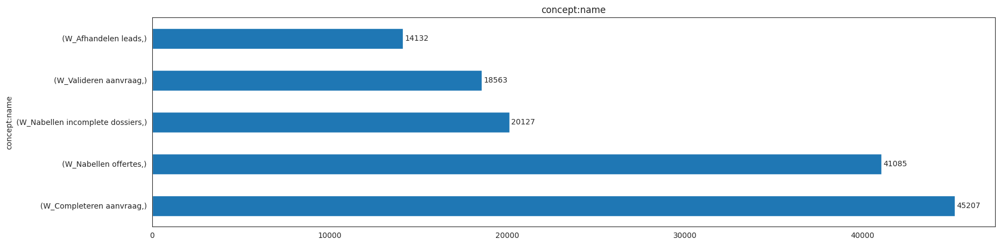

📌 Total items: 139114
⚠️ Low-frequency items (<1391 occurrences): 0 items
🔥 High-frequency items (>13911 occurrences): 5 items

🔹 Low-frequency items (examples):
Series([], Name: count, dtype: int64)

🔥 High-frequency items (examples):
concept:name                  
W_Completeren aanvraag            45207
W_Nabellen offertes               41085
W_Nabellen incomplete dossiers    20127
W_Valideren aanvraag              18563
W_Afhandelen leads                14132
Name: count, dtype: int64


In [80]:
event_counts = show_values_count_distribution(log=log_W, column="concept:name",
                               figsize=(20, 5), text_offset=100,
                               filepath=os.path.join("figure", "log_W_value_counts_concept_name.png"))

# Classify event based on their frequencies
event_classification = classify_counts(count_series=event_counts, total_count=log_W.shape[0])

In [81]:
log_W = log_W[(log_W["concept:name"] != "W_Beoordelen fraude") & (log_W["concept:name"] != "W_Wijzigen contractgegevens")]
log_W["concept:name"].unique()

array(['W_Completeren aanvraag', 'W_Nabellen offertes',
       'W_Valideren aanvraag', 'W_Afhandelen leads',
       'W_Nabellen incomplete dossiers'], dtype=object)

#### 6.1.3 Analyzed **lifecycle:transition** and inconsistency


===== PLOTTING & SAVING: lifecycle:transition DISTRIBUTION =====


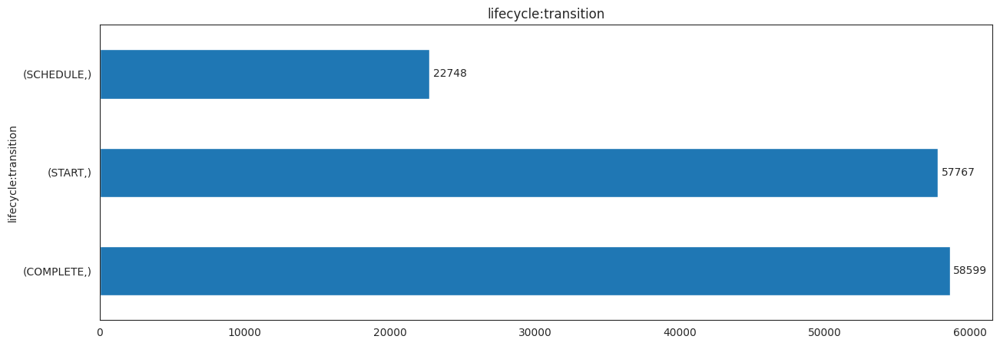

In [82]:
event_counts = show_values_count_distribution(log=log_W, column="lifecycle:transition",
                               figsize=(15, 5), text_offset=250,
                               filepath=os.path.join("figure", "log_W_value_counts_lifecycle_transition.png"))

### 6.2 - Process Discovery

In [85]:
#event_log_W = event_log_W[event_log_W["lifecycle:transition"]=="SCHEDULE"]
event_log_W = convert_to_event_log(log_W)
overall_metrics = {}

#### 6.2.1 Alpha Miner


===== DISCOVERING PETRI NET USING ALPHA ALGORITHM =====


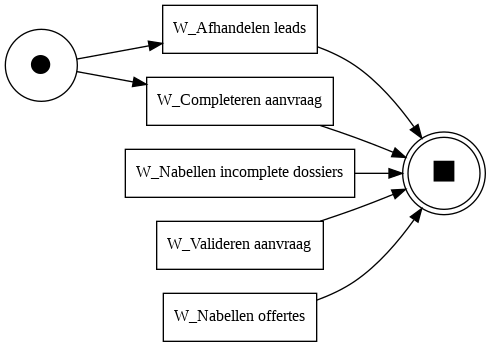


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 2
🔹 Number of transitions: 5
🔹 Number of arcs: 7
🔹 Initial marking: ['start:1']
🔹 Final marking: ['end:1']
🔹 Is the Petri Net a Workflow Net? False
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/2679 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 4.15335463258786, 'average_trace_fitness': 0.25391042093311283, 'log_fitness': 0.12250406569899652, 'percentage_of_fitting_traces': 4.15335463258786}


computing precision with alignments, completed variants ::   0%|          | 0/23503 [00:00<?, ?it/s]

🎯 Precision: 0.5013031135104947


replaying log with TBR, completed traces ::   0%|          | 0/2679 [00:00<?, ?it/s]

📈 Generalization: 0.9935125722014438
✨ Simplicity: 1.0


In [86]:
net_alpha_W, im_alpha_W, fm_alpha_W = discover_petri_net(event_log_W, algorithm="alpha",
                                 filepath=os.path.join("figure", "log_W_petri_net_alpha.png"))
overall_metrics['Alpha Miner'] = evaluate_petri_net_metrics(event_log_W, net_alpha_W, im_alpha_W, fm_alpha_W)

#### 6.2.2 Heuristics Miner


===== DISCOVERING PETRI NET USING HEURISTICS ALGORITHM =====


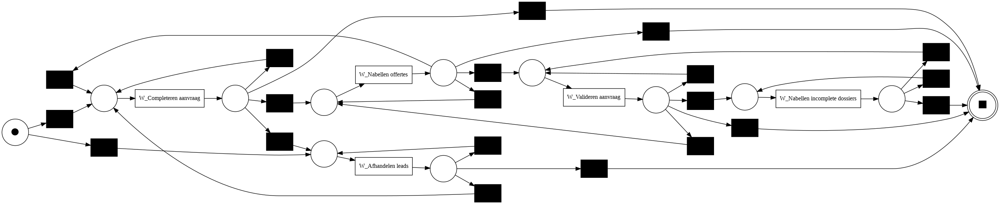


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 12
🔹 Number of transitions: 25
🔹 Number of arcs: 50
🔹 Initial marking: ['source0:1']
🔹 Final marking: ['sink0:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/2679 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 97.84069626528589, 'average_trace_fitness': 0.9979838984797659, 'log_fitness': 0.9985436851346844, 'percentage_of_fitting_traces': 97.84069626528589}


computing precision with alignments, completed variants ::   0%|          | 0/23503 [00:00<?, ?it/s]

🎯 Precision: 0.6130243836723697


replaying log with TBR, completed traces ::   0%|          | 0/2679 [00:00<?, ?it/s]

📈 Generalization: 0.9853912829250534
✨ Simplicity: 0.5873015873015873


In [87]:
net_heuristics_W, im_heuristics_W, fm_heuristics_W = discover_petri_net(event_log_W, algorithm="heuristics",
                                 filepath=os.path.join("figure", "log_W_petri_net_heuristics.png"))
overall_metrics['Heuristics Miner'] = evaluate_petri_net_metrics(event_log_W, net_heuristics_W, im_heuristics_W, fm_heuristics_W)

#### 6.2.3 Inductive Miner


===== DISCOVERING PETRI NET USING INDUCTIVE ALGORITHM =====


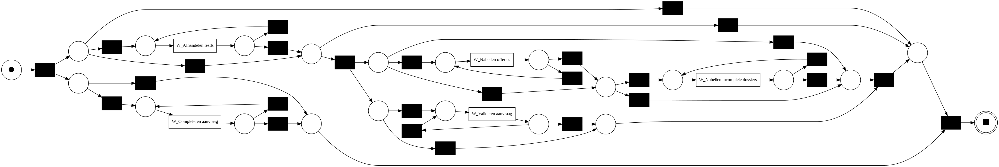


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 22
🔹 Number of transitions: 32
🔹 Number of arcs: 68
🔹 Initial marking: ['source:1']
🔹 Final marking: ['sink:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/2679 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9998546862832285, 'percentage_of_fitting_traces': 100.0}


computing precision with alignments, completed variants ::   0%|          | 0/23503 [00:00<?, ?it/s]

🎯 Precision: 0.43959046219605413


replaying log with TBR, completed traces ::   0%|          | 0/2679 [00:00<?, ?it/s]

📈 Generalization: 0.973638698402876
✨ Simplicity: 0.6585365853658536


In [88]:
net_inductive_W, im_inductive_W, fm_inductive_W = discover_petri_net(event_log_W, algorithm="inductive",
                                 filepath=os.path.join("figure", "log_W_petri_net_inductive.png"))
overall_metrics['Inductive Miner'] = evaluate_petri_net_metrics(event_log_W, net_inductive_W, im_inductive_W, fm_inductive_W)

#### 6.2.4 Summary and Comparison

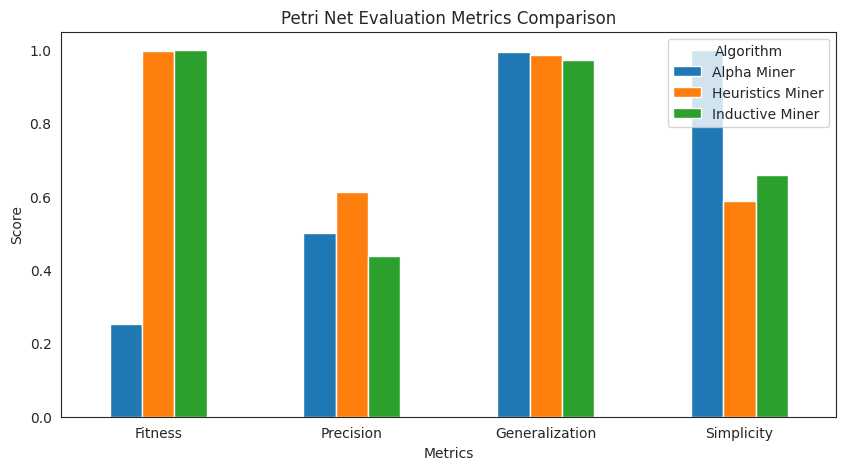

In [89]:
plot_and_save_petri_net_metrics(overall_metrics, save_path=os.path.join("figure", "log_W_overall_metrics.png"))

### 6.3 - LLM Integration for Textual and Visual Abstractions & Report Generation

#### 6.3.1 Abstraction Generation using *pm4py.llm.*

##### Compares abstract_case() output with actual trace data

In [90]:
case_abstraction = validate_case_abstraction(event_log_W, case_index=1)


📊 Case Abstraction Validation:
🔹 Case 1 Raw Data:
    - W_Completeren aanvraag; 2011-10-01 08:09:59.578000; SCHEDULE; 112
    - W_Nabellen offertes; 2011-10-10 10:13:44.827000; START; 11049
    - W_Valideren aanvraag; 2011-10-10 10:14:44.052000; SCHEDULE; 11049
    - W_Nabellen offertes; 2011-10-10 10:14:45.514000; COMPLETE; 11049
    - W_Valideren aanvraag; 2011-10-10 11:12:36.612000; START; 10809
    - W_Valideren aanvraag; 2011-10-10 11:30:54.893000; COMPLETE; 10809
    - W_Valideren aanvraag; 2011-10-10 14:11:42.124000; START; 10809
    - W_Valideren aanvraag; 2011-10-10 14:14:13.394000; COMPLETE; 10809
    - W_Valideren aanvraag; 2011-10-10 14:14:52.842000; START; 10809
    - W_Valideren aanvraag; 2011-10-10 14:17:34.633000; COMPLETE; 10809
-------------------------------------------------------------------------------------

🔍 Generated Case Summary:

If I have a case with the following (case) attributes:

REG_DATE = 2011-10-01 08:08:58.256000
concept:name = 173691
AMOUNT_REQ = 

##### Checks abstract_variants() output against real process variants

In [91]:
variants_abstraction = validate_variants_abstraction(event_log_W)


📊 Process Variants Validation:

===== PROCESS VARIANTS ANALYSIS =====
📝 Total unique variants: 2679
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

##### Ensures abstract_log_attributes() matches real log attributes

In [92]:
validate_log_attributes_abstraction(event_log_W)


📊 Log Attributes Validation:
🔹 Number of unique activities: 5
🔹 Most frequent activities:
 concept:name
W_Completeren aanvraag            45207
W_Nabellen offertes               41085
W_Nabellen incomplete dossiers    20127
W_Valideren aanvraag              18563
W_Afhandelen leads                14132
Name: count, dtype: int64
🔹 Available attributes in the dataset:
 ['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ', 'case:trace_duration']

🔍 Generated Log Attributes Summary:
case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-13 19:48:04.198000128'), 0.5: Timestamp('2011-12-27 11:25:23.160000'), 0.75: Timestamp('2012-01-28 17:51:16.435000064'), 1.0: Timestamp('2012-02-29 23:51:16.799000064')}
case:trace_duration  empty: 0  quantiles: {0.0: 66.618, 0.25: 855741.3605, 0.5: 1469340.836, 0.75: 2596711.005, 1.0: 4928049.989}
concept:name  empty: 0 val

"case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-13 19:48:04.198000128'), 0.5: Timestamp('2011-12-27 11:25:23.160000'), 0.75: Timestamp('2012-01-28 17:51:16.435000064'), 1.0: Timestamp('2012-02-29 23:51:16.799000064')}\ncase:trace_duration  empty: 0  quantiles: {0.0: 66.618, 0.25: 855741.3605, 0.5: 1469340.836, 0.75: 2596711.005, 1.0: 4928049.989}\nconcept:name  empty: 0 values: (W_Completeren aanvraag; freq. 45207) (W_Nabellen offertes; freq. 41085) (W_Nabellen incomplete dossiers; freq. 20127) (W_Valideren aanvraag; freq. 18563) (W_Afhandelen leads; freq. 14132)\nlifecycle:transition  empty: 0 values: (COMPLETE; freq. 58599) (START; freq. 57767) (SCHEDULE; freq. 22748)\norg:resource  empty: 0 values: (112; freq. 9064) (11181; freq. 5573) (10861; freq. 5330) (11169; freq. 5097) (11180; freq. 4926) (10913; freq. 4899) (10609; freq. 4860) (11119; freq. 4805) (11203; freq. 4684) (10909; freq. 4657) (11189; freq. 4469) (11201;

##### Compares abstract_petri_net() output with real Petri net structure



###### Alpha Miner Evaluation

In [93]:
petri_net_alpha_abstraction_W = validate_petri_net_abstraction(net_alpha_W, im_alpha_W, fm_alpha_W)


📊 Petri Net Validation:
🔹 Petri Net Places: {'end', 'start'}
🔹 Petri Net Transitions: {'W_Afhandelen leads', 'W_Nabellen incomplete dossiers', 'W_Nabellen offertes', 'W_Valideren aanvraag', 'W_Completeren aanvraag'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ end, start ]
transitions: [ (W_Afhandelen leads, 'W_Afhandelen leads'), (W_Completeren aanvraag, 'W_Completeren aanvraag'), (W_Nabellen incomplete dossiers, 'W_Nabellen incomplete dossiers'), (W_Nabellen offertes, 'W_Nabellen offertes'), (W_Valideren aanvraag, 'W_Valideren aanvraag') ]
arcs: [ (W_Afhandelen leads, 'W_Afhandelen leads')->end, (W_Completeren aanvraag, 'W_Completeren aanvraag')->end, (W_Nabellen incomplete dossiers, 'W_Nabellen incomplete dossiers')->end, (W_Nabellen offertes, 'W_Nabellen offertes')->end, (W_Valideren aanvraag, 'W_Valideren aanvraag')->end, start->(W_Afhandelen leads, 'W_Afhandelen leads'), start->(W_Completeren aanvraag, 'W_Completeren aanvraag') ]

initial marking: ['start:

###### Heuristics Miner Evaluation

In [94]:
petri_net_heuristics_abstraction_W = validate_petri_net_abstraction(net_heuristics_W, im_heuristics_W, fm_heuristics_W)


📊 Petri Net Validation:
🔹 Petri Net Places: {'intplace_W_Afhandelen leads', 'pre_W_Completeren aanvraag', 'sink0', 'pre_W_Afhandelen leads', 'pre_W_Nabellen offertes', 'intplace_W_Completeren aanvraag', 'intplace_W_Valideren aanvraag', 'pre_W_Valideren aanvraag', 'intplace_W_Nabellen incomplete dossiers', 'source0', 'intplace_W_Nabellen offertes', 'pre_W_Nabellen incomplete dossiers'}
🔹 Petri Net Transitions: {'W_Afhandelen leads', 'W_Nabellen incomplete dossiers', 'W_Nabellen offertes', 'W_Valideren aanvraag', 'W_Completeren aanvraag'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ intplace_W_Afhandelen leads, intplace_W_Completeren aanvraag, intplace_W_Nabellen incomplete dossiers, intplace_W_Nabellen offertes, intplace_W_Valideren aanvraag, pre_W_Afhandelen leads, pre_W_Completeren aanvraag, pre_W_Nabellen incomplete dossiers, pre_W_Nabellen offertes, pre_W_Valideren aanvraag, sink0, source0 ]
transitions: [ (W_Afhandelen leads, 'W_Afhandelen leads'), (W_Comple

###### Inductive Miner Evaluation

In [95]:
petri_net_inductive_abstraction_W = validate_petri_net_abstraction(net_inductive_W, im_inductive_W, fm_inductive_W)


📊 Petri Net Validation:
🔹 Petri Net Places: {'p_7', 'p_6', 'p_24', 'source', 'p_11', 'p_16', 'p_10', 'p_21', 'p_22', 'p_18', 'p_23', 'p_5', 'p_12', 'p_28', 'p_17', 'p_25', 'p_19', 'sink', 'p_8', 'p_27', 'p_13', 'p_14'}
🔹 Petri Net Transitions: {'W_Afhandelen leads', 'W_Nabellen incomplete dossiers', 'W_Nabellen offertes', 'W_Valideren aanvraag', 'W_Completeren aanvraag'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ p_10, p_11, p_12, p_13, p_14, p_16, p_17, p_18, p_19, p_21, p_22, p_23, p_24, p_25, p_27, p_28, p_5, p_6, p_7, p_8, sink, source ]
transitions: [ (00e0087a-5e43-436f-9bd8-2ee263d519f7, 'W_Valideren aanvraag'), (0407fe38-2ccb-40a6-8b6f-6aaf94a985da, 'W_Completeren aanvraag'), (54cc9f54-d650-4368-ad4a-75e2a1cd05c7, 'W_Afhandelen leads'), (95b4a49b-3aad-4680-b0f8-7391ca3326d3, 'W_Nabellen incomplete dossiers'), (ecc25ba3-9e2a-4d6c-9281-cfc608908cfb, 'W_Nabellen offertes'), (init_loop_12, None), (init_loop_20, None), (init_loop_26, None), (init_loop_31, N

#### 6.3.2 Query the LLMs for case and variants abstraction explanation


In [96]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "case", case_abstraction, "What are the anomalies?"))

## Analysis of the Case Abstraction and Anomalies

This case exhibits several anomalies and inconsistencies suggesting potential issues in the underlying business process:

**Anomalies/Inconsistencies:**

1. **Multiple Starts and Completions of "W_Valideren aanvraag":**  The activity "W_Valideren aanvraag" is started and completed multiple times within the same case. This suggests either a rework loop, a misclassification of events, or a poorly designed process where validation happens in multiple stages without clear distinction.  It's unusual to have a task restarted and completed *three* separate times.

2. **"W_Completeren aanvraag" Scheduled before other Activities:** The first activity "W_Completeren aanvraag" is marked as `SCHEDULE` but occurs *before* the "W_Nabellen offertes" activity which is marked as `START`.  This implies a potential issue with event ordering or timestamp accuracy.  It's unusual to schedule a completion *before* starting related tasks.

3. **Confusing Life

In [97]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "variants", variants_abstraction, "Can you explain the different paths?"))

## Analysis of Process Variants

This process appears to involve two main activities: "W_Afhandelen leads" (Handling Leads) and "W_Completeren aanvraag" (Completing Applications).  The variants reveal several paths and potential issues.

**Anomalies and Inconsistencies:**

* **Zero Performance Times:** Several variants, including high-frequency ones like "W_Afhandelen leads (frequency = 307)" and "W_Completeren aanvraag (frequency = 70)", have a performance of 0.000. This is highly unusual and suggests a problem with data capture.  Timestamps for start and completion of these activities are likely missing or incorrect.  This needs immediate investigation.
* **"Nabellen offertes" and "Valideren aanvraag" Introduction:**  The activities "W_Nabellen offertes" (Calling Quotes) and "W_Valideren aanvraag" (Validating Application) appear only in lower-frequency variants but contribute significantly to the overall performance time. This indicates a branching point in the process that leads to 

#### 6.3.3 Petri Net Evaluation using LLM & Large Vision Language Models (LVLMs)

##### Alpha Miner Evaluation

In [98]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_alpha_abstraction_W, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net represents a highly simplified and potentially flawed process model.  It describes a process with several independent activities all originating from a single starting point and converging to a single end point.

**Anomalies and Inconsistencies:**

* **Parallel and Independent Activities:**  The model shows five transitions (activities) that are all enabled immediately after the start place. This indicates they can occur in any order and independently of each other.  There's no depicted relationship or sequence between them. This is unusual in real-world processes, which typically involve some level of dependency or ordering.
* **Missing Context:** The activity names (e.g., "W_Afhandelen leads," "W_Completeren aanvraag") suggest a context related to lead management and application processing. However, the net lacks details about how these activities relate. For instance, does completing an application ("W_Completeren aanvraag") happen before

In [99]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_W_petri_net_alpha.png"))

This Petri net represents a simple process, likely related to handling customer requests or leads. Let's analyze it step-by-step:


**Process Flow Description:**

The Petri net starts with a single source place (the leftmost circle with a black dot), representing the arrival of a new lead or request.  This leads to two parallel activities:

1. **W_Afhandelen leads:** This activity likely involves the initial processing or assignment of the lead.
2. **W_Completeren aanvraag:** This activity seems to focus on completing the request, perhaps gathering necessary information.

After these parallel activities, the process converges.  Three more activities then follow:

1. **W_Nabellen incomplete dossiers:** This suggests following up on incomplete requests.
2. **W_Valideren aanvraag:** This likely involves validating the completed request.
3. **W_Nabellen offertes:** This implies calling to discuss offers.


All three activities feed into a single sink place (the rightmost circle with a blac

##### Heuristics Miner Evaluation

In [100]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_heuristics_abstraction_W, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net represents a process with several issues, primarily stemming from the numerous "hidden" transitions (hid_*) that obscure the actual process flow and create unnecessary complexity.  These hidden transitions likely represent silent transitions introduced during the model discovery process, potentially due to log incompleteness or noise. Their presence hinders clear interpretation and process improvement analysis.

**Anomalies and Inconsistencies:**

* **Hidden Transitions Obfuscating Flow:**  The extensive use of hidden transitions makes it difficult to understand the relationships between activities. It's impossible to determine what conditions or decisions lead to different paths being taken.
* **Parallelism without Synchronization:** The model seems to allow for the parallel execution of  "W_Afhandelen leads," "W_Completeren aanvraag," "W_Nabellen incomplete dossiers," "W_Nabellen offertes," and "W_Valideren aanvraag." However, there's no a

In [101]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_W_petri_net_heuristics.png"))

The provided Petri net depicts a business process, likely related to order fulfillment or a similar workflow.  However, the lack of clear labeling on the transitions (black squares) and places (white circles) makes a precise interpretation challenging. The Dutch labels on some transitions offer partial insight but are insufficient for complete understanding.  To provide a thorough analysis, I will make some assumptions based on common workflow patterns and the partial labels.

**Process Flow (Assumptions):**

Assuming the Dutch labels represent tasks in a process:

* The process starts at the leftmost circle (Start).
* The process follows multiple parallel paths.  Each path represents a different aspect of handling a request or order (e.g., validating the request, contacting potential clients, dealing with incomplete requests).
* Several transitions seem to represent different phases of handling these requests/orders, indicated by parallel paths that converge later.
* The rightmost cir

##### Inductive Miner Evaluation

In [102]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_inductive_abstraction_W, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net represents a process with several parallel and iterative subprocesses related to application handling, likely in a business context like loan applications or insurance claims. Let's break down the process, identify anomalies, and suggest improvements.

**1. Anomalies and Inconsistencies:**

* **Silent Transitions:** The net contains numerous "skip_" and "tau" transitions. While "tau" transitions represent hidden internal actions which can be legitimate, the sheer number of "skip" transitions suggests potential issues with the underlying event log or the process mining algorithm. These "skips" create artificial pathways that might not reflect the real process execution.  This heavily inflated the complexity of the model and makes it harder to analyze.
* **Unnecessary Loops:**  Loops formed by `(p_10, skip_10, p_11, tauJoin_4, sink)` , `(p_5, skip_5, p_6, tauJoin_4, sink)`, and similar constructs with skip transitions offer no practical value 

In [103]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_W_petri_net_inductive.png"))

The provided Petri net represents a complex process, likely related to application processing or order fulfillment.  The use of Dutch labels suggests a specific business context. Let's analyze it:


**Process Flow Description:**

The process starts at the leftmost place (a circle representing a resource or state), which acts as the entry point.  Tokens (representing cases or applications) move through a series of transitions (black squares representing activities) and places.  The process seems to involve several stages:

1. **Initial Handling:** The process begins with "W_Afhandelen leads" (handling leads), followed by several parallel or sequential activities represented by the branching paths.

2. **Validation and Completion:** There's a prominent path involving "W_Valideren offertes" (validating offers), "W_Valideren aanvraag" (validating application), and "W_Completeren aanvraag" (completing the application). This suggests a stage where applications are rigorously checked.

3. **I

#### 6.3.4 Performance Comparison and Evaluations using Large Language Models (LLMs)

In [104]:
print(summarize_metrics(api_key, "gemini-1.5-pro", overall_metrics))

## Comparative Report: Process Mining Algorithms

This report analyzes the performance of three process mining algorithms – Alpha Miner, Heuristics Miner, and Inductive Miner – based on the provided fitness, precision, generalization, and simplicity metrics.  We'll discuss their strengths, weaknesses, and recommend scenarios where each algorithm excels.

**Metrics Definition Reminder:**

* **Fitness:** Measures how well the discovered model represents the observed behavior in the event log (higher is better).
* **Precision:** Indicates the fraction of behavior in the discovered model that is also present in the event log (higher is better).  A low precision suggests the model includes behavior not observed in the real process.
* **Generalization:** Represents the model's ability to predict unseen behavior. It reflects how well the model generalizes from the event log to the underlying process (higher is better).
* **Simplicity:**  Measures how easily understandable the discovered model



---



## **7 - Application-Offer Event Log Analysis**

### 7.1 - Process Discovery

In [106]:
log_AO = pd.concat([log_A, log_O])
event_log_AO = convert_to_event_log(log_AO)
overall_metrics = {}

#### 7.1.1 Alpha Miner


===== DISCOVERING PETRI NET USING ALPHA ALGORITHM =====


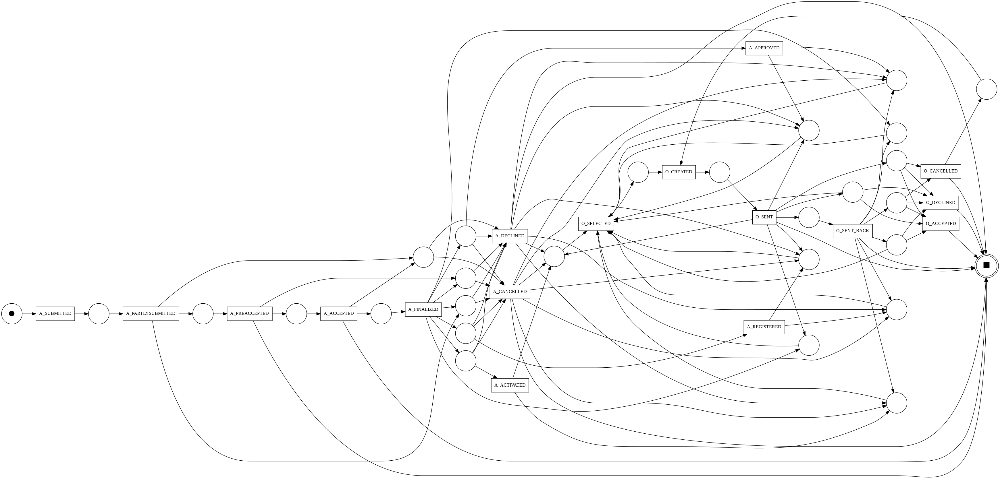


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 28
🔹 Number of transitions: 17
🔹 Number of arcs: 102
🔹 Initial marking: ['start:1']
🔹 Final marking: ['end:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


replaying log with TBR, completed traces ::   0%|          | 0/264 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 0, 'average_trace_fitness': 0.5914029400638068, 'log_fitness': 0.6533964697782556, 'percentage_of_fitting_traces': 0.0}


replaying log with TBR, completed traces ::   0%|          | 0/1113 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/264 [00:00<?, ?it/s]

📈 Generalization: 0.9832130069330101
✨ Simplicity: 0.2830188679245283


In [107]:
net_alpha_AO, im_alpha_AO, fm_alpha_AO = discover_petri_net(event_log_AO, algorithm="alpha",
                                 filepath=os.path.join("figure", "log_AO_petri_net_alpha.png"))
overall_metrics['Alpha Miner'] = evaluate_petri_net_metrics(event_log_AO, net_alpha_AO, im_alpha_AO, fm_alpha_AO)

#### 7.1.2 Heuristics Miner


===== DISCOVERING PETRI NET USING HEURISTICS ALGORITHM =====


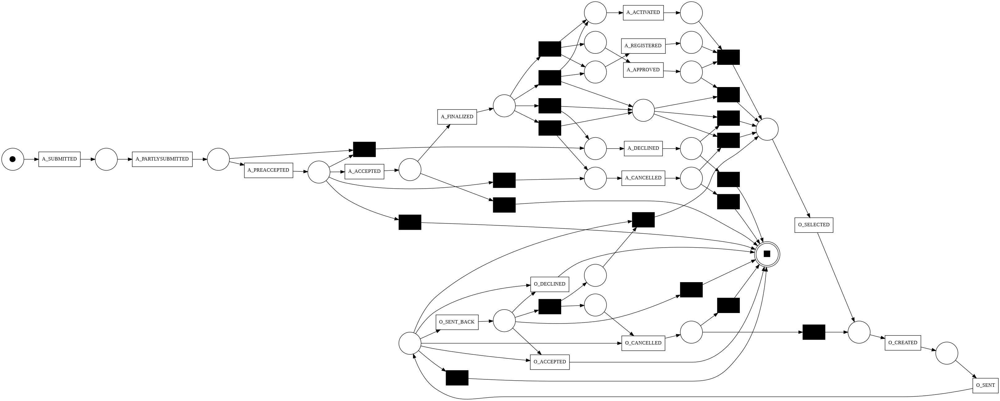


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 26
🔹 Number of transitions: 37
🔹 Number of arcs: 91
🔹 Initial marking: ['source0:1']
🔹 Final marking: ['sink0:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/264 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 8.865134222793763, 'average_trace_fitness': 0.7862569312516763, 'log_fitness': 0.8036959221547296, 'percentage_of_fitting_traces': 8.865134222793763}


computing precision with alignments, completed variants ::   0%|          | 0/1113 [00:00<?, ?it/s]

🎯 Precision: 1.0


replaying log with TBR, completed traces ::   0%|          | 0/264 [00:00<?, ?it/s]

📈 Generalization: 0.8805976532931338
✨ Simplicity: 0.5294117647058824


In [108]:
net_heuristics_AO, im_heuristics_AO, fm_heuristics_AO = discover_petri_net(event_log_AO, algorithm="heuristics",
                                 filepath=os.path.join("figure", "log_AO_petri_net_heuristics.png"))
overall_metrics['Heuristics Miner'] = evaluate_petri_net_metrics(event_log_AO, net_heuristics_AO, im_heuristics_AO, fm_heuristics_AO)

#### 7.1.3 Inductive Miner


===== DISCOVERING PETRI NET USING INDUCTIVE ALGORITHM =====


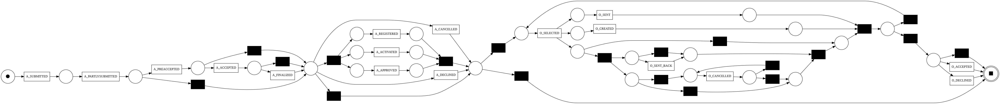


===== PETRI NET EVALUATION REPORT =====
🔹 Number of places: 29
🔹 Number of transitions: 37
🔹 Number of arcs: 84
🔹 Initial marking: ['source:1']
🔹 Final marking: ['sink:1']
🔹 Is the Petri Net a Workflow Net? True
-------------------------------------------------------------------------------------


aligning log, completed variants ::   0%|          | 0/264 [00:00<?, ?it/s]

🔥 Fitness: {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 0.9999432496895311, 'percentage_of_fitting_traces': 100.0}


computing precision with alignments, completed variants ::   0%|          | 0/1113 [00:00<?, ?it/s]

🎯 Precision: 0.5413662921620013


replaying log with TBR, completed traces ::   0%|          | 0/264 [00:00<?, ?it/s]

📈 Generalization: 0.9780175011871262
✨ Simplicity: 0.6470588235294118


In [109]:
net_inductive_AO, im_inductive_AO, fm_inductive_AO = discover_petri_net(event_log_AO, algorithm="inductive",
                                 filepath=os.path.join("figure", "log_AO_petri_net_inductive.png"))
overall_metrics['Inductive Miner'] = evaluate_petri_net_metrics(event_log_AO, net_inductive_AO, im_inductive_AO, fm_inductive_AO)

#### 7.1.4 Summary and Comparison

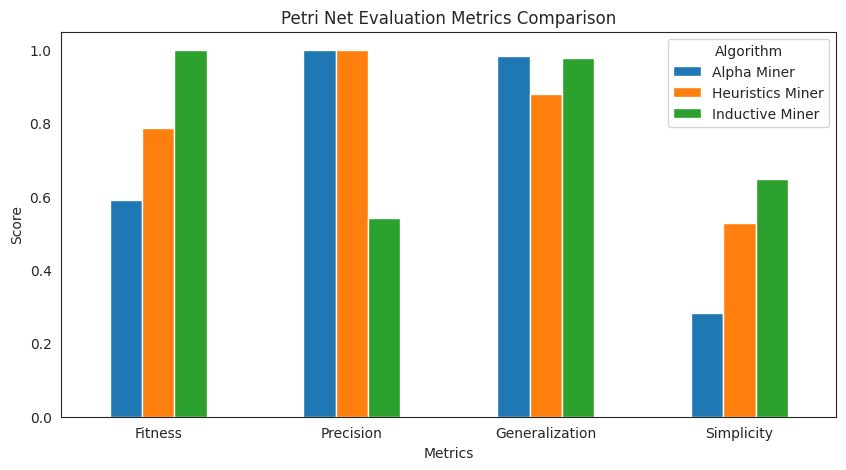

In [110]:
plot_and_save_petri_net_metrics(overall_metrics, save_path=os.path.join("figure", "log_AO_overall_metrics.png"))

### 7.2 - LLM Integration for Textual and Visual Abstractions & Report Generation

#### 7.2.1 Abstraction Generation using *pm4py.llm.*

##### Compares abstract_case() output with actual trace data

In [111]:
case_abstraction = validate_case_abstraction(event_log_AO, case_index=1)


📊 Case Abstraction Validation:
🔹 Case 1 Raw Data:
    - A_SUBMITTED; 2011-10-01 08:08:58.256000; COMPLETE; 112
    - A_PARTLYSUBMITTED; 2011-10-01 08:09:02.195000; COMPLETE; 112
    - A_PREACCEPTED; 2011-10-01 08:09:56.648000; COMPLETE; 112
    - A_ACCEPTED; 2011-10-01 14:33:54.614000; COMPLETE; 10862
    - A_FINALIZED; 2011-10-01 14:35:46.016000; COMPLETE; 10862
    - A_APPROVED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - A_REGISTERED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - A_ACTIVATED; 2011-10-10 14:17:26.307000; COMPLETE; 10809
    - O_SELECTED; 2011-10-01 14:35:46.016000; COMPLETE; 10862
    - O_CREATED; 2011-10-01 14:35:47.488000; COMPLETE; 10862
    - O_SENT; 2011-10-01 14:35:47.583000; COMPLETE; 10862
    - O_SELECTED; 2011-10-03 16:56:17.731000; COMPLETE; 11120
    - O_CANCELLED; 2011-10-03 16:56:17.731000; COMPLETE; 11120
    - O_CREATED; 2011-10-03 16:56:19.613000; COMPLETE; 11120
    - O_SENT; 2011-10-03 16:56:19.645000; COMPLETE; 11120
    - O_SENT_BACK; 

##### Checks abstract_variants() output against real process variants

In [112]:
variants_abstraction = validate_variants_abstraction(event_log_AO)


📊 Process Variants Validation:

===== PROCESS VARIANTS ANALYSIS =====
📝 Total unique variants: 264
                                                                                                                                                                                                                                                                                                                                                                                                                                                     Variant  Occurrences
                                                                                                                                                                                                                                                                                                                                                                                                                (A_SUBMITTED, A_PARTLYSUBMITTED, A_DECLINE

##### Ensures abstract_log_attributes() matches real log attributes

In [113]:
validate_log_attributes_abstraction(event_log_AO)


📊 Log Attributes Validation:
🔹 Number of unique activities: 17
🔹 Most frequent activities:
 concept:name
A_PARTLYSUBMITTED    12442
A_SUBMITTED          12442
A_DECLINED            7289
A_PREACCEPTED         6903
O_CREATED             6546
Name: count, dtype: int64
🔹 Available attributes in the dataset:
 ['org:resource', 'lifecycle:transition', 'concept:name', 'time:timestamp', 'case:REG_DATE', 'case:concept:name', 'case:AMOUNT_REQ', 'case:trace_duration']

🔍 Generated Log Attributes Summary:
case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-09 01:28:05.318000128'), 0.5: Timestamp('2011-12-18 15:40:41.084499968'), 0.75: Timestamp('2012-01-25 19:34:07.790000128'), 1.0: Timestamp('2012-02-29 23:51:16.799000064')}
case:trace_duration  empty: 0  quantiles: {0.0: 1.855, 0.25: 116212.367, 0.5: 1047820.9010000001, 0.75: 1795821.647, 1.0: 4928049.989}
concept:name  empty: 0 values: (A_SUBMITTED; freq. 12442) (A_PARTLYSUBMITTED; freq

"case:REG_DATE  empty: 0  quantiles: {0.0: Timestamp('2011-10-01 00:38:44.545999872'), 0.25: Timestamp('2011-11-09 01:28:05.318000128'), 0.5: Timestamp('2011-12-18 15:40:41.084499968'), 0.75: Timestamp('2012-01-25 19:34:07.790000128'), 1.0: Timestamp('2012-02-29 23:51:16.799000064')}\ncase:trace_duration  empty: 0  quantiles: {0.0: 1.855, 0.25: 116212.367, 0.5: 1047820.9010000001, 0.75: 1795821.647, 1.0: 4928049.989}\nconcept:name  empty: 0 values: (A_SUBMITTED; freq. 12442) (A_PARTLYSUBMITTED; freq. 12442) (A_DECLINED; freq. 7289) (A_PREACCEPTED; freq. 6903) (O_SENT; freq. 6546) (O_SELECTED; freq. 6546) (O_CREATED; freq. 6546) (A_ACCEPTED; freq. 4809) (A_FINALIZED; freq. 4718) (O_CANCELLED; freq. 3362) (O_SENT_BACK; freq. 3240) (A_CANCELLED; freq. 2633) (A_REGISTERED; freq. 2149) (A_APPROVED; freq. 2149) (A_ACTIVATED; freq. 2149) (O_ACCEPTED; freq. 2146) (O_DECLINED; freq. 729)\norg:resource  empty: 0 values: (112; freq. 34211) (10138; freq. 3224) (10972; freq. 2317) (11169; freq. 203

##### Compares abstract_petri_net() output with real Petri net structure



###### Alpha Miner Evaluation

In [114]:
petri_net_alpha_abstraction_AO = validate_petri_net_abstraction(net_alpha_AO, im_alpha_AO, fm_alpha_AO)


📊 Petri Net Validation:
🔹 Petri Net Places: {"({'A_PARTLYSUBMITTED', 'A_FINALIZED'}, {'A_CANCELLED', 'A_DECLINED'})", "({'A_FINALIZED'}, {'A_REGISTERED', 'A_CANCELLED', 'A_DECLINED'})", 'start', "({'A_ACTIVATED', 'O_SENT_BACK', 'A_CANCELLED', 'A_DECLINED'}, {'O_SELECTED'})", 'end', "({'O_CREATED'}, {'O_SENT'})", "({'O_SENT'}, {'O_ACCEPTED', 'O_SELECTED', 'O_DECLINED'})", "({'O_SELECTED'}, {'O_CREATED'})", "({'A_PARTLYSUBMITTED', 'A_ACCEPTED'}, {'A_CANCELLED', 'A_DECLINED'})", "({'O_SENT_BACK', 'A_CANCELLED', 'A_REGISTERED', 'A_DECLINED'}, {'O_SELECTED'})", "({'A_FINALIZED', 'O_SENT_BACK'}, {'O_SELECTED'})", "({'A_FINALIZED'}, {'A_ACTIVATED', 'A_CANCELLED', 'A_DECLINED'})", "({'A_FINALIZED'}, {'A_APPROVED', 'A_CANCELLED', 'A_DECLINED'})", "({'O_CANCELLED'}, {'O_CREATED'})", "({'A_PARTLYSUBMITTED'}, {'A_PREACCEPTED'})", "({'A_APPROVED', 'O_SENT_BACK', 'A_CANCELLED', 'A_DECLINED'}, {'O_SELECTED'})", "({'A_PREACCEPTED'}, {'A_ACCEPTED'})", "({'A_ACCEPTED'}, {'A_FINALIZED'})", "({'O_SENT_BA

###### Heuristics Miner Evaluation

In [115]:
petri_net_heuristics_abstraction_AO = validate_petri_net_abstraction(net_heuristics_AO, im_heuristics_AO, fm_heuristics_AO)


📊 Petri Net Validation:
🔹 Petri Net Places: {'intplace_A_PREACCEPTED', 'intplace_A_FINALIZED', 'source0', 'pre_O_SENT', 'pre_O_SELECTED', 'intplace_A_ACCEPTED', 'pre_A_ACTIVATED', 'splace_in_O_CANCELLED_O_SENT_BACK_0', 'pre_O_CREATED', 'pre_A_PARTLYSUBMITTED', 'pre_A_REGISTERED', 'pre_A_APPROVED', 'intplace_O_CANCELLED', 'intplace_O_SENT_BACK', 'intplace_A_DECLINED', 'splace_in_O_SELECTED_A_REGISTERED_0', 'splace_in_O_SELECTED_O_SENT_BACK_6', 'splace_in_O_SELECTED_A_ACTIVATED_0', 'intplace_A_CANCELLED', 'pre_A_CANCELLED', 'sink0', 'splace_in_O_SELECTED_A_APPROVED_0', 'pre_A_DECLINED', 'intplace_A_PARTLYSUBMITTED', 'intplace_O_SENT', 'splace_in_O_SELECTED_A_FINALIZED_1'}
🔹 Petri Net Transitions: {'A_PARTLYSUBMITTED', 'O_ACCEPTED', 'A_FINALIZED', 'A_CANCELLED', 'A_ACCEPTED', 'A_APPROVED', 'O_SENT_BACK', 'O_CANCELLED', 'A_PREACCEPTED', 'O_SENT', 'A_DECLINED', 'O_CREATED', 'A_REGISTERED', 'A_ACTIVATED', 'A_SUBMITTED', 'O_SELECTED', 'O_DECLINED'}

🔍 Generated Petri Net Summary:


If I have

###### Inductive Miner Evaluation

In [116]:
petri_net_inductive_abstraction_AO = validate_petri_net_abstraction(net_inductive_AO, im_inductive_AO, fm_inductive_AO)


📊 Petri Net Validation:
🔹 Petri Net Places: {'p_7', 'p_6', 'p_24', 'source', 'p_15', 'p_16', 'p_11', 'p_21', 'p_10', 'p_22', 'p_23', 'p_20', 'p_5', 'p_12', 'p_28', 'p_17', 'p_29', 'p_25', 'p_26', 'p_3', 'p_19', 'sink', 'p_8', 'p_4', 'p_30', 'p_9', 'p_27', 'p_13', 'p_14'}
🔹 Petri Net Transitions: {'A_PARTLYSUBMITTED', 'A_FINALIZED', 'O_ACCEPTED', 'A_CANCELLED', 'A_ACCEPTED', 'A_APPROVED', 'O_SENT_BACK', 'O_SENT', 'A_PREACCEPTED', 'O_CANCELLED', 'A_DECLINED', 'O_CREATED', 'A_REGISTERED', 'A_ACTIVATED', 'A_SUBMITTED', 'O_SELECTED', 'O_DECLINED'}

🔍 Generated Petri Net Summary:


If I have a Petri net:

places: [ p_10, p_11, p_12, p_13, p_14, p_15, p_16, p_17, p_19, p_20, p_21, p_22, p_23, p_24, p_25, p_26, p_27, p_28, p_29, p_3, p_30, p_4, p_5, p_6, p_7, p_8, p_9, sink, source ]
transitions: [ (1c4f0bb3-108d-45bd-aecb-e709de3edb79, 'A_ACCEPTED'), (1f44bd11-6a41-44ce-9d69-49bbbaf2e72a, 'A_DECLINED'), (22cbb565-9c19-44b3-b4e2-ecd926666d9a, 'O_SELECTED'), (28aaf442-91a8-4bcb-bf1d-12504c9250

#### 7.2.1 Query the LLMs for case and variants abstraction explanation


In [117]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "case", case_abstraction, "What are the anomalies?"))

## Analysis of the Case Abstraction and Anomalies

This case reveals several anomalies and potential areas for process improvement.  The process appears to be related to application submission, review, and offer generation/acceptance, possibly for a loan or similar financial product.

**Anomalies and Inconsistencies:**

1. **Rework in Offer Creation (O_SELECTED/O_CREATED/O_SENT):** The sequence "O_SELECTED -> O_CREATED -> O_SENT" appears twice, the second time after "O_CANCELLED". This suggests a rework loop where an offer was created, sent, then cancelled, necessitating a new offer creation cycle. This rework adds time and effort to the process.  It's crucial to understand *why* the first offer was cancelled to address the root cause of this rework.

2. **Timestamp Synchronization Issues (A_APPROVED/A_REGISTERED/A_ACTIVATED/O_ACCEPTED):** These four activities share the exact same timestamp. While technically possible, it's highly unlikely that these distinct actions occurred at preci

In [118]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "variants", variants_abstraction, "Can you explain the different paths?"))

## Analysis of Process Variants

This process appears to relate to application processing, involving submission, evaluation, acceptance/decline, and order fulfillment.  Let's break down the observed paths and identify areas of concern.

**Process Explanation:**

The common starting point for all variants is `A_SUBMITTED` followed by `A_PARTLYSUBMITTED`.  This suggests an initial submission and a subsequent stage involving partial completion or further information gathering.

After this, the process diverges:

1. **Fast Decline Path:**  `A_DECLINED`.  This is the most frequent path, indicating a high decline rate early in the process.

2. **Pre-Acceptance Path:** `A_PREACCEPTED`. This leads to several sub-paths:
    * **Declined after Pre-Acceptance:** `A_DECLINED`.
    * **Cancelled after Pre-Acceptance:** `A_CANCELLED`. This can happen directly after `A_PREACCEPTED` or after `A_ACCEPTED` and `A_FINALIZED`.
    * **Acceptance Path:** `A_ACCEPTED` -> `A_FINALIZED`. This is the core succ

#### 7.2.3 Petri Net Evaluation using LLM & Large Vision Language Models (LVLMs)

##### Alpha Miner Evaluation

In [119]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_alpha_abstraction_AO, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net models a process involving application and offer handling, exhibiting several complexities and potential issues.

**Anomalies and Inconsistencies:**

1. **Deadlocks:**  The net contains potential deadlocks. For example, if an application is `A_ACTIVATED` and the corresponding offer is `O_SENT`, and then the application is `A_CANCELLED` while the offer is also `O_CANCELLED`, the process can get stuck. This is because the place representing `O_SELECTED` might be empty, preventing the `O_CREATED` transition from firing. Similar scenarios can occur involving `A_DECLINED` and other combinations of application and offer statuses.

2. **Lack of Clear Order:** The frequent interleaving of application (A_*) and offer (O_*) statuses creates ambiguity regarding the intended process flow.  It's difficult to ascertain the precise dependencies between application status changes and the corresponding offer handling steps. For instance, it's unclear if an o

In [120]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_AO_petri_net_alpha.png"))

The provided Petri net depicts a complex process, likely involving application (A) and order (O) processing.  The sheer number of arcs and lack of clear structure makes analysis challenging, pointing to potential design flaws. Let's break down the issues:


**Process Flow Description:**

The process begins with an application submission (`A_SUBMITTED`). It progresses through stages like partial submission (`A_PARTLY_SUBMITTED`), pre-acceptance (`A_PREACCEPTED`), acceptance (`A_ACCEPTED`), and finally, finalization (`A_FINALIZED`).  Orders (`O_CREATED`) are generated seemingly in parallel, undergo selection (`O_SELECTED`), sending (`O_SENT`), potential sending back (`O_SENT_BACK`), acceptance (`O_ACCEPTED`), or rejection (`O_DECLINED`/`O_CANCELLED`).  Applications can also be declined (`A_DECLINED`) or canceled (`A_CANCELLED`) at various stages.  The interaction between application and order processing is poorly defined due to the high number of arcs connecting them. There's also a regi

##### Heuristics Miner Evaluation

In [121]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_heuristics_abstraction_AO, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net describes a process involving two main entities, likely an "Order" (O) and an "Application" (A).  The process starts with the submission of an application and ends with the acceptance or decline of the order.

**Process Explanation:**

1. **Application Submission (A_SUBMITTED):** The process initiates with the submission of an application (A).

2. **Application Partially Submitted (A_PARTLYSUBMITTED):** The application moves to a partially submitted state.  From here, it can be pre-accepted or declined.

3. **Application Pre-accepted (A_PREACCEPTED):** If pre-accepted, the application can then be either fully accepted, cancelled, or declined. There are also transitions `hid_20` and `hid_24` connected to `A_PREACCEPTED` and `A_ACCEPTED` that lead directly to the sink. These likely represent shortcuts or exceptions in the process, allowing the order to be finalized quickly under certain conditions.

4. **Application Accepted (A_ACCEPTED):**  U

In [122]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_AO_petri_net_heuristics.png"))

This Petri net depicts a process with significant complexities and potential inefficiencies. Let's break down the analysis:


**Process Flow Description:**

The process starts with a submission (A_SUBMITTED). It progresses through partial submission (A_PARTLYSUBMITTED), pre-acceptance (A_PREACCEPTED), and acceptance (A_ACCEPTED).  The accepted application then moves towards finalization (A_FINALIZED).  However, there are multiple branches for rejection or cancellation at various stages (A_DECLINED, A_CANCELLED).

A parallel process seems to exist, potentially representing an order or another related entity (O). This 'O' process interacts with the 'A' process through several transitions, implying an interdependency.  The 'O' process has its own acceptance, rejection, and creation phases (O_ACCEPTED, O_DECLINED, O_CREATED, O_SELECTED). The final step appears to be the sending of the 'O' entity (O_SENT).


**Deadlocks and Livelocks:**

The complexity makes it challenging to definitively i

##### Inductive Miner Evaluation

In [123]:
print(explain_abstraction(api_key, "gemini-1.5-pro", "petri_net", petri_net_inductive_abstraction_AO, "Explain the process in the net."))

## Analysis of the Petri Net

This Petri net describes a process involving two intertwined sub-processes: one for "A" (likely an application or approval) and another for "O" (likely an order or offer).  Let's break it down:

**A Process:**

1. **Start:** The process begins with A_SUBMITTED.
2. **Partial Submission/Pre-Acceptance:**  A_PARTLYSUBMITTED can lead to A_PREACCEPTED, potentially skipping this step via skip_1.
3. **Acceptance/Finalization:** A_ACCEPTED leads to A_FINALIZED, with the possibility of skipping pre-acceptance via skip_2 and/or finalization via skip_3.
4. **Decline/Cancellation:** At various stages, A can be A_DECLINED or A_CANCELLED, potentially skipping directly to these states from finalization via skip_4.
5. **Approval/Activation/Registration:** After finalization, the process can branch into three parallel paths: A_APPROVED, A_ACTIVATED (after A_REGISTERED), and a direct path through skip_9 to A_APPROVED. These paths converge before reaching a decision point re

In [124]:
print(analyze_petri_net(api_key, "gemini-1.5-flash", "figure/log_AO_petri_net_inductive.png"))

This Petri net depicts a process with two seemingly independent branches, one labeled "A" and the other "O," possibly representing two different types of requests or orders.  However, the structure reveals several issues impacting efficiency and correctness.


**Process Flow Description:**

* **Branch A (e.g., Application Process):** An application starts (A_SUBMITTED), proceeds to partially submitted (A_PARTLYSUBMITTED), then to pre-accepted (A_PREACCEPTED).  It then follows multiple paths:  it can be accepted (A_ACCEPTED), registered (A_REGISTERED), activated (A_ACTIVATED), or approved (A_APPROVED). These states aren't clearly defined in the model, so their distinctions and relationships are unclear.  From here, it can transition to a finalized state (A_FINALIZED), but also has a cancellation path (A_CANCELLED) and a declined path (A_DECLINED).  The transitions between these states are not explicitly defined which adds to the ambiguity.

* **Branch O (e.g., Order Process):**  A simil

#### 7.2.4 Performance Comparison and Evaluations using Large Language Models (LLMs)

In [125]:
print(summarize_metrics(api_key, "gemini-1.5-pro", overall_metrics))

## Comparative Report: Process Mining Algorithms

This report analyzes the performance of three process mining algorithms – Alpha Miner, Heuristics Miner, and Inductive Miner – based on provided metrics for fitness, precision, generalization, and simplicity.  We'll dissect their strengths and weaknesses, provide key insights, and offer recommendations for their application.

**Metrics Definitions:**

* **Fitness:** Measures how well the discovered model represents the observed behavior in the event log (higher is better, ideally 1.0).
* **Precision:**  Indicates the proportion of behavior in the discovered model that is also present in the event log (higher is better, ideally 1.0).  A lower precision suggests "overfitting," where the model includes behavior not observed in the log.
* **Generalization:**  Represents the model's ability to predict future behavior based on the event log (higher is better, ideally 1.0). A low generalization suggests overfitting to the specific event log.
*



---



## **8 - org:resource Analysis**

#### 8.1 Analyzed **org:resource** and their properties: Underutilized/ Overloaded - Bottleneck


===== PLOTTING & SAVING: org:resource DISTRIBUTION =====


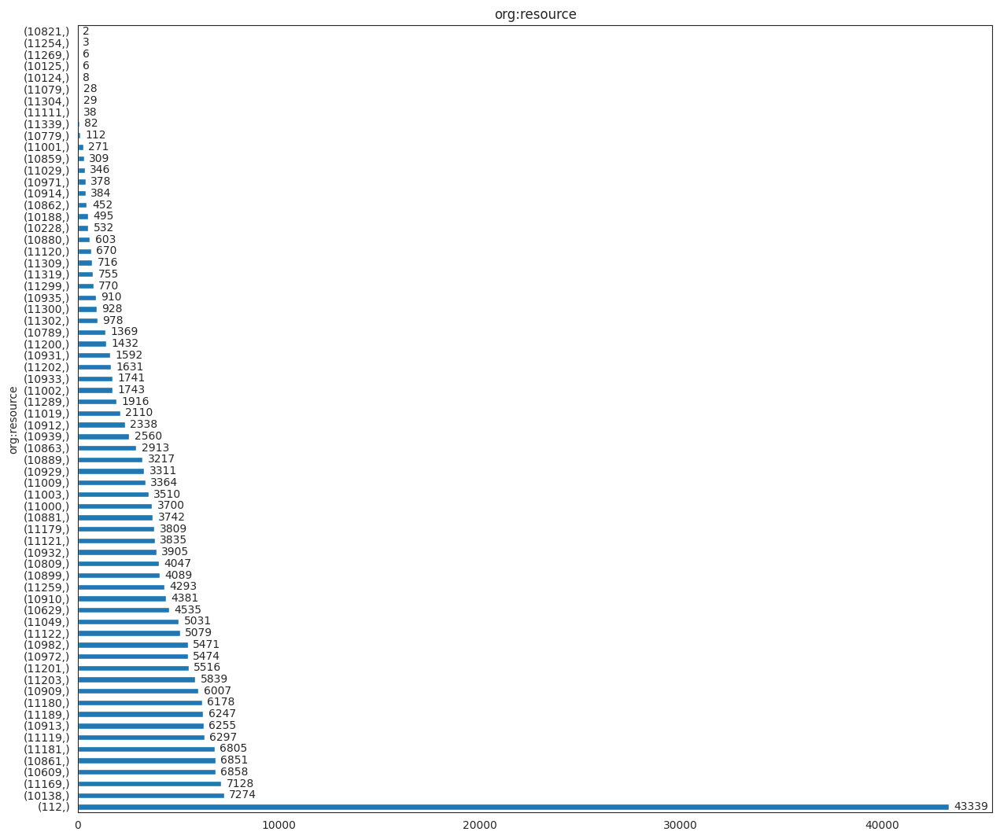

📌 Total items: 226543
⚠️ Low-frequency items (<2265 occurrences): 34 items
🔥 High-frequency items (>22654 occurrences): 1 items

🔹 Low-frequency items (examples):
org:resource
11019           2110
11289           1916
11002           1743
10933           1741
11202           1631
10931           1592
11200           1432
10789           1369
11302            978
11300            928
Name: count, dtype: int64

🔥 High-frequency items (examples):
org:resource
112             43339
Name: count, dtype: int64


In [126]:
resource_counts=show_values_count_distribution(log=cleaned_event_log, column="org:resource",
                               figsize=(15, 13), text_offset=250,
                               filepath=os.path.join("figure", "value_counts_org_resource.png"))

resource_outliers = classify_counts(count_series=resource_counts, total_count=cleaned_event_log.shape[0])

In [127]:
pd.crosstab(cleaned_event_log["org:resource"], cleaned_event_log["concept:name"])

concept:name,A_ACCEPTED,A_ACTIVATED,A_APPROVED,A_CANCELLED,A_DECLINED,A_FINALIZED,A_PARTLYSUBMITTED,A_PREACCEPTED,A_REGISTERED,A_SUBMITTED,...,O_SELECTED,O_SENT,O_SENT_BACK,W_Afhandelen leads,W_Beoordelen fraude,W_Completeren aanvraag,W_Nabellen incomplete dossiers,W_Nabellen offertes,W_Valideren aanvraag,W_Wijzigen contractgegevens
org:resource,,,,,,,,,,,,,,,,,,,,,
10124,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,3,2,1
10125,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,4,2
10138,6,662,662,5,146,6,0,3,662,0,...,61,61,22,8,0,19,758,56,3209,0
10188,0,0,0,0,55,0,0,0,0,0,...,0,0,0,25,402,1,0,0,12,0
10228,5,0,0,2,47,3,0,38,0,0,...,3,3,1,210,0,178,15,11,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11302,25,0,0,6,13,25,0,2,0,0,...,34,34,0,24,1,491,22,251,3,0
11304,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,28,0,0,0,0,0
11309,12,0,0,19,7,11,0,0,0,0,...,16,16,0,0,0,361,8,234,0,0


In [128]:
pd.crosstab(cleaned_event_log["org:resource"], cleaned_event_log["concept:name"], normalize='columns')

concept:name,A_ACCEPTED,A_ACTIVATED,A_APPROVED,A_CANCELLED,A_DECLINED,A_FINALIZED,A_PARTLYSUBMITTED,A_PREACCEPTED,A_REGISTERED,A_SUBMITTED,...,O_SELECTED,O_SENT,O_SENT_BACK,W_Afhandelen leads,W_Beoordelen fraude,W_Completeren aanvraag,W_Nabellen incomplete dossiers,W_Nabellen offertes,W_Valideren aanvraag,W_Wijzigen contractgegevens
org:resource,,,,,,,,,,,,,,,,,,,,,
10124,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000142,0.000000,0.000000,0.000000,0.000073,0.000108,0.1
10125,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000215,0.2
10138,0.001248,0.308050,0.308050,0.001899,0.020030,0.001272,0.0,0.000435,0.308050,0.0,...,0.009319,0.009319,0.006790,0.000566,0.000000,0.000420,0.037661,0.001363,0.172871,0.0
10188,0.000000,0.000000,0.000000,0.000000,0.007546,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.001769,0.647343,0.000022,0.000000,0.000000,0.000646,0.0
10228,0.001040,0.000000,0.000000,0.000760,0.006448,0.000636,0.0,0.005505,0.000000,0.0,...,0.000458,0.000458,0.000309,0.014860,0.000000,0.003937,0.000745,0.000268,0.000593,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11302,0.005199,0.000000,0.000000,0.002279,0.001784,0.005299,0.0,0.000290,0.000000,0.0,...,0.005194,0.005194,0.000000,0.001698,0.001610,0.010861,0.001093,0.006109,0.000162,0.0
11304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000071,0.045089,0.000000,0.000000,0.000000,0.000000,0.0
11309,0.002495,0.000000,0.000000,0.007216,0.000960,0.002331,0.0,0.000000,0.000000,0.0,...,0.002444,0.002444,0.000000,0.000000,0.000000,0.007985,0.000397,0.005696,0.000000,0.0


In [129]:
pd.crosstab(cleaned_event_log["org:resource"], cleaned_event_log["concept:name"], normalize='index')

concept:name,A_ACCEPTED,A_ACTIVATED,A_APPROVED,A_CANCELLED,A_DECLINED,A_FINALIZED,A_PARTLYSUBMITTED,A_PREACCEPTED,A_REGISTERED,A_SUBMITTED,...,O_SELECTED,O_SENT,O_SENT_BACK,W_Afhandelen leads,W_Beoordelen fraude,W_Completeren aanvraag,W_Nabellen incomplete dossiers,W_Nabellen offertes,W_Valideren aanvraag,W_Wijzigen contractgegevens
org:resource,,,,,,,,,,,,,,,,,,,,,
10124,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.375000,0.250000,0.125000
10125,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.666667,0.333333
10138,0.000825,0.091009,0.091009,0.000687,0.020071,0.000825,0.0,0.000412,0.091009,0.0,...,0.008386,0.008386,0.003024,0.001100,0.000000,0.002612,0.104207,0.007699,0.441160,0.000000
10188,0.000000,0.000000,0.000000,0.000000,0.111111,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.050505,0.812121,0.002020,0.000000,0.000000,0.024242,0.000000
10228,0.009398,0.000000,0.000000,0.003759,0.088346,0.005639,0.0,0.071429,0.000000,0.0,...,0.005639,0.005639,0.001880,0.394737,0.000000,0.334586,0.028195,0.020677,0.020677,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11302,0.025562,0.000000,0.000000,0.006135,0.013292,0.025562,0.0,0.002045,0.000000,0.0,...,0.034765,0.034765,0.000000,0.024540,0.001022,0.502045,0.022495,0.256646,0.003067,0.000000
11304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.034483,0.965517,0.000000,0.000000,0.000000,0.000000,0.000000
11309,0.016760,0.000000,0.000000,0.026536,0.009777,0.015363,0.0,0.000000,0.000000,0.0,...,0.022346,0.022346,0.000000,0.000000,0.000000,0.504190,0.011173,0.326816,0.000000,0.000000
